# PROJ-4_ Drugs_ Side Effects and Medical Condition_UM_Nandini

## Submitted by Dr.Nandni Arvind

# Drugs Side Effects and Medical Condition Project

### OBJECTIVE :
- The goal is to analyze the relationships between drugs, their side effects, and the
medical conditions they treat, as well as to explore the ratings and reviews
associated with these drugs.


### TOOLS REQUIRED:

Python: The primary programming language for data analysis.
    
Pandas: For data manipulation and analysis.
    
Matplotlib/Seaborn: For data visualization.
    
Jupyter Notebook: To write and run Python code.


### About the Dataset

Drugs, Side Effects and Medical Condition Dataset:

https://www.kaggle.com/datasets/jithinanievarghese/drugs-side-effects-and-medical-condition

Data contains details of various drugs (used for conditions like Acne, Cancer, Heart Disease, etc. ) and their side effects

The dataset contains 17 columns

- drug_name: Name of the drug
- medical_condition: The medical condition for which the drug is used
- side_effects: A tuple of cut-short explanations of the side-effects of using the specific drug for the specific medical condition
- generic_name: Common name of the drug
- drug_classes: The class to which the drug belongs to
- brand_names: Brand names in which the drugs are sold or are available
- activity: A measure to check the site-visitor activity relative to other medications list
- rx_otc: OTC - Medication can be purchased without a prescription, Rx - Prescription Needed, Rx/OTC -prescription or over-the-counter    
- pregnancy_category: A = Adequate and well-controlled studies have failed to demonstrate a risk to the fetus in the first trimester of pregnancy (and there is no evidence of risk in later trimesters), B = Animal reproduction studies have failed to demonstrate a risk to the fetus and there are no adequate and well-controlled studies in pregnant women, C = Animal reproduction studies have shown an adverse effect on the fetus and there are no adequate and well-controlled studies in humans, but potential benefits may warrant use in pregnant women despite potential risks, D = There is positive evidence of human fetal risk based on adverse reaction data from investigational or marketing experience or studies in humans, but potential benefits may warrant use in pregnant women despite potential risks, X = Studies in animals or humans have demonstrated fetal abnormalities and/or there is positive evidence of human fetal risk based on adverse reaction data from investigational or marketing experience, and the risks involved in use in pregnant women clearly outweigh potential benefits, N = FDA has not classified the drug.
- csa: Controlled Substances Act(CSA) Schedule. M - Multiple Schedules, U - Schedule is unknown, N - Is not related to csa
- alcohol: X - interacts with alcohol
- related_drugs: drugs related to the drug in discussion
- medical_condition_description: description of the condition for which the drug can be used
- rating: effectiveness of the drug (user-ratings)
- no_of_reviews: No of reviews
- drug_link: a link to access more information about the drug
- medical_condition_url: a link to access more information about the medical condition being discussed


# Step 1: Importing libraries:

In [1]:
# Analysis
import pandas as pd
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',500)
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Extra
import warnings
warnings.filterwarnings(action="ignore")

In [4]:
# Import Required Libraries
import pandas as pd
import math
import random
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import openpyxl
from openpyxl.styles import PatternFill
import squarify

import plotly.graph_objects as go
import plotly.express as px
import scipy.stats as stats
import mlxtend
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.frequent_patterns import fpgrowth

# data loading

In [5]:
# loading application dataset
df3 = pd.read_csv("drugs_side_effects_drugs_com.csv")

In [8]:
df3.head(3)

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,csa,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews,drug_link,medical_condition_url
0,doxycycline,Acne,"(hives, difficult breathing, swelling in your ...",doxycycline,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Adoxa CK, Adoxa Pak, Adoxa TT, Alod...",87%,Rx,D,N,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.8,760.0,https://www.drugs.com/doxycycline.html,https://www.drugs.com/condition/acne.html
1,spironolactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...","Aldactone, CaroSpir",82%,Rx,C,N,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.2,449.0,https://www.drugs.com/spironolactone.html,https://www.drugs.com/condition/acne.html
2,minocycline,Acne,"skin rash, fever, swollen glands, flu-like sym...",minocycline,Tetracyclines,"Dynacin, Minocin, Minolira, Solodyn, Ximino, V...",48%,Rx,D,N,NaN,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,482.0,https://www.drugs.com/minocycline.html,https://www.drugs.com/condition/acne.html


In [9]:
df3.tail()

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,csa,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews,drug_link,medical_condition_url
2926,benzphetamine,Weight Loss,hives ; difficulty breathing; swelling of your...,benzphetamine,"Anorexiants, CNS stimulants","Didrex, Regimex",2%,Rx,X,3,X,phentermine: https://www.drugs.com/phentermine...,Weight Loss (Obesity/Overweight) More than hal...,7.5,17.0,https://www.drugs.com/mtm/benzphetamine.html,https://www.drugs.com/condition/obesity.html
2927,fenfluramine,Weight Loss,hives ; difficult breathing; swelling of your ...,fenfluramine,"Anorexiants, CNS stimulants, Miscellaneous ant...",Fintepla,1%,Rx,C,4,X,NaN,Weight Loss (Obesity/Overweight) More than hal...,NaN,NaN,https://www.drugs.com/mtm/fenfluramine.html,https://www.drugs.com/condition/obesity.html
2928,Fendique ER,Weight Loss,NaN,phendimetrazine tartrate,"Anorexiants, CNS stimulants",NaN,0%,Rx,C,3,X,phentermine: https://www.drugs.com/phentermine...,Weight Loss (Obesity/Overweight) More than hal...,NaN,NaN,https://www.drugs.com/pro/fendique-er.html,https://www.drugs.com/condition/obesity.html
2929,Imcivree,Weight Loss,"Imcivree may cause serious side effects, inclu...",setmelanotide,Melanocortin receptor agonists,NaN,0%,Rx,NaN,N,NaN,phentermine: https://www.drugs.com/phentermine...,Weight Loss (Obesity/Overweight) More than hal...,NaN,NaN,https://www.drugs.com/imcivree.html,https://www.drugs.com/condition/obesity.html
2930,setmelanotide,Weight Loss,hives ; difficult breathing; swelling of your ...,setmelanotide,Melanocortin receptor agonists,Imcivree,0%,Rx,NaN,N,NaN,phentermine: https://www.drugs.com/phentermine...,Weight Loss (Obesity/Overweight) More than hal...,NaN,NaN,https://www.drugs.com/mtm/setmelanotide.html,https://www.drugs.com/condition/obesity.html


# 

# 

# Step 2: Inspecting the Dataframe

In [10]:
df3.ndim

2

In [11]:
df3.shape

(2931, 17)

In [12]:
df3.dtypes

drug_name                         object
medical_condition                 object
side_effects                      object
generic_name                      object
drug_classes                      object
brand_names                       object
activity                          object
rx_otc                            object
pregnancy_category                object
csa                               object
alcohol                           object
related_drugs                     object
medical_condition_description     object
rating                           float64
no_of_reviews                    float64
drug_link                         object
medical_condition_url             object
dtype: object

In [13]:
#view columns :
df3.columns

Index(['drug_name', 'medical_condition', 'side_effects', 'generic_name',
       'drug_classes', 'brand_names', 'activity', 'rx_otc',
       'pregnancy_category', 'csa', 'alcohol', 'related_drugs',
       'medical_condition_description', 'rating', 'no_of_reviews', 'drug_link',
       'medical_condition_url'],
      dtype='object')

In [14]:
#checking info 
df3.info

<bound method DataFrame.info of            drug_name medical_condition  \
0        doxycycline              Acne   
1     spironolactone              Acne   
2        minocycline              Acne   
3           Accutane              Acne   
4        clindamycin              Acne   
...              ...               ...   
2926   benzphetamine       Weight Loss   
2927    fenfluramine       Weight Loss   
2928     Fendique ER       Weight Loss   
2929        Imcivree       Weight Loss   
2930   setmelanotide       Weight Loss   

                                           side_effects  \
0     (hives, difficult breathing, swelling in your ...   
1     hives ; difficulty breathing; swelling of your...   
2     skin rash, fever, swollen glands, flu-like sym...   
3     problems with your vision or hearing; muscle o...   
4     hives ; difficult breathing; swelling of your ...   
...                                                 ...   
2926  hives ; difficulty breathing; swelling of yo

In [15]:
#checking info with index number 
df3.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2931 entries, 0 to 2930
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   drug_name                      2931 non-null   object 
 1   medical_condition              2931 non-null   object 
 2   side_effects                   2807 non-null   object 
 3   generic_name                   2888 non-null   object 
 4   drug_classes                   2849 non-null   object 
 5   brand_names                    1718 non-null   object 
 6   activity                       2931 non-null   object 
 7   rx_otc                         2930 non-null   object 
 8   pregnancy_category             2702 non-null   object 
 9   csa                            2931 non-null   object 
 10  alcohol                        1377 non-null   object 
 11  related_drugs                  1462 non-null   object 
 12  medical_condition_description  2931 non-null   o

In [16]:
df3.describe()

,rating,no_of_reviews
count,1586.000000,1586.000000
mean,6.812926,75.064943
std,2.313044,184.900847
min,0.000000,1.000000
25%,5.600000,2.000000
50%,7.000000,12.000000
75%,8.500000,58.000000
max,10.000000,2934.000000


In [17]:
# dtypes-  valuecounts
df3.dtypes.value_counts()
# cols are mixed : float/int/FLOAT values

object     15
float64     2
dtype: int64

In [18]:
df3.corr()
#it will give correlation  with every numerical column

,rating,no_of_reviews
rating,1.000000,-0.044656
no_of_reviews,-0.044656,1.000000


# 

## Calculating total medical conditions, their counts and %:

In [19]:
# Calculating total medical conditions
total medical conditions = df3['medical_condition'].value_counts(normalize=True) * 100
total medical conditions

SyntaxError: invalid syntax (2594147351.py, line 2)

In [20]:
df3['medical_condition'].value_counts()

Pain                    264
Colds & Flu             245
Acne                    238
Hypertension            177
Osteoarthritis          129
Hayfever                124
Eczema                  122
AIDS/HIV                109
Diabetes (Type 2)       104
Psoriasis                93
GERD (Heartburn)         77
Pneumonia                72
Angina                   71
Bronchitis               71
Migraine                 61
Insomnia                 60
Constipation             60
Diabetes (Type 1)        57
Osteoporosis             56
ADHD                     55
Depression               51
Seizures                 50
Bipolar Disorder         47
UTI                      46
Asthma                   45
Anxiety                  45
Cholesterol              45
Diarrhea                 38
Covid 19                 34
Rheumatoid Arthritis     33
Alzheimer's              27
Weight Loss              23
COPD                     23
IBD (Bowel)              22
Cancer                   20
Schizophrenia       

In [21]:
df3['medical_condition'].nunique()

47

In [22]:
df3['medical_condition'].unique()

array(['Acne', 'ADHD', 'AIDS/HIV', 'Allergies', "Alzheimer's", 'Angina',
       'Anxiety', 'Asthma', 'Bipolar Disorder', 'Bronchitis', 'Cancer',
       'Cholesterol', 'Colds & Flu', 'Constipation', 'COPD', 'Covid 19',
       'Depression', 'Diabetes (Type 1)', 'Diabetes (Type 2)', 'Diarrhea',
       'Eczema', 'Erectile Dysfunction', 'Gastrointestinal',
       'GERD (Heartburn)', 'Gout', 'Hair Loss', 'Hayfever', 'Herpes',
       'Hypertension', 'Hypothyroidism', 'IBD (Bowel)', 'Incontinence',
       'Insomnia', 'Menopause', 'Migraine', 'Osteoarthritis',
       'Osteoporosis', 'Pain', 'Pneumonia', 'Psoriasis',
       'Rheumatoid Arthritis', 'Schizophrenia', 'Seizures', 'Stroke',
       'Swine Flu', 'UTI', 'Weight Loss'], dtype=object)

# 

# Step 3: Data Preparation

# Checking  Missing values:
   

In [23]:
## check  the missing values
df3.isnull().sum().sort_values(ascending=False)

alcohol                          1554
related_drugs                    1469
no_of_reviews                    1345
rating                           1345
brand_names                      1213
pregnancy_category                229
side_effects                      124
drug_classes                       82
generic_name                       43
rx_otc                              1
medical_condition_description       0
drug_link                           0
drug_name                           0
csa                                 0
medical_condition                   0
activity                            0
medical_condition_url               0
dtype: int64

In [24]:
# check  the missing values percetange in descending order of each column of the dataframe: 
null_per = (df3.isnull().mean() * 100).sort_values(ascending=False)
null_per

alcohol                          53.019447
related_drugs                    50.119413
no_of_reviews                    45.888775
rating                           45.888775
brand_names                      41.385193
pregnancy_category                7.813033
side_effects                      4.230638
drug_classes                      2.797680
generic_name                      1.467076
rx_otc                            0.034118
medical_condition_description     0.000000
drug_link                         0.000000
drug_name                         0.000000
csa                               0.000000
medical_condition                 0.000000
activity                          0.000000
medical_condition_url             0.000000
dtype: float64

## 1. Selection - Dropping irrelevant attributes
- Column under the name 'csa' can be removed as all of its values are 'N', indicating that it is not related to the data
- Column under the names 'drug_link' and 'medical_condition_url' can be removed as they are just links to more data

In [25]:
df3 = df3.drop(['csa', 'drug_link', 'medical_condition_url'], axis=1)

In [26]:
df3.shape

(2931, 14)

## Observation:
- All of the given data is not relevant to CSA or Control Substances Act

# 

## 2. Data Cleaning - add values to the empty spaces of data
- W.R.T the given data, it has been observed that, when it comes to some attributes with binary values, one option is mentioned and other option is left empty to indicate the opposite.
- To make it simpler for calculations, we can add add values to the empty spaces of data

In [27]:
columns_to_be_modified = ['pregnancy_category', 'alcohol'] 

# Every other attributes with null values is indication that the data is not available

for i in df3.index:
    for j in columns_to_be_modified:
        check_ = df3[j].isnull()
        if check_[i] == True:
            df3.loc[i, j] = 0
            
df3

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews
0,doxycycline,Acne,"(hives, difficult breathing, swelling in your ...",doxycycline,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Adoxa CK, Adoxa Pak, Adoxa TT, Alod...",87%,Rx,D,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.8,760.0
1,spironolactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...","Aldactone, CaroSpir",82%,Rx,C,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.2,449.0
2,minocycline,Acne,"skin rash, fever, swollen glands, flu-like sym...",minocycline,Tetracyclines,"Dynacin, Minocin, Minolira, Solodyn, Ximino, V...",48%,Rx,D,0,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,482.0
3,Accutane,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...",NaN,41%,Rx,X,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.9,623.0
4,clindamycin,Acne,hives ; difficult breathing; swelling of your ...,clindamycin topical,"Topical acne agents, Vaginal anti-infectives","Cleocin T, Clindacin ETZ, Clindacin P, Clindag...",39%,Rx,B,0,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.4,146.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2926,benzphetamine,Weight Loss,hives ; difficulty breathing; swelling of your...,benzphetamine,"Anorexiants, CNS stimulants","Didrex, Regimex",2%,Rx,X,X,phentermine: https://www.drugs.com/phentermine...,Weight Loss (Obesity/Overweight) More than hal...,7.5,17.0
2927,fenfluramine,Weight Loss,hives ; difficult breathing; swelling of your ...,fenfluramine,"Anorexiants, CNS stimulants, Miscellaneous ant...",Fintepla,1%,Rx,C,X,NaN,Weight Loss (Obesity/Overweight) More than hal...,NaN,NaN
2928,Fendique ER,Weight Loss,NaN,phendimetrazine tartrate,"Anorexiants, CNS stimulants",NaN,0%,Rx,C,X,phentermine: https://www.drugs.com/phentermine...,Weight Loss (Obesity/Overweight) More than hal...,NaN,NaN
2929,Imcivree,Weight Loss,"Imcivree may cause serious side effects, inclu...",setmelanotide,Melanocortin receptor agonists,NaN,0%,Rx,0,0,phentermine: https://www.drugs.com/phentermine...,Weight Loss (Obesity/Overweight) More than hal...,NaN,NaN


In [28]:
# Remove any empty values
df3a = df3
df3a = df3a.dropna(axis=0)
df3a

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews
0,doxycycline,Acne,"(hives, difficult breathing, swelling in your ...",doxycycline,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Adoxa CK, Adoxa Pak, Adoxa TT, Alod...",87%,Rx,D,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.8,760.0
1,spironolactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...","Aldactone, CaroSpir",82%,Rx,C,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.2,449.0
2,minocycline,Acne,"skin rash, fever, swollen glands, flu-like sym...",minocycline,Tetracyclines,"Dynacin, Minocin, Minolira, Solodyn, Ximino, V...",48%,Rx,D,0,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,482.0
4,clindamycin,Acne,hives ; difficult breathing; swelling of your ...,clindamycin topical,"Topical acne agents, Vaginal anti-infectives","Cleocin T, Clindacin ETZ, Clindacin P, Clindag...",39%,Rx,B,0,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.4,146.0
5,Aldactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...",CaroSpir,35%,Rx,C,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.6,8.0
7,isotretinoin,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Claravis, Myori...",26%,Rx,X,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.0,999.0
11,benzoyl peroxide,Acne,Benzoyl peroxide topical can cause a rare but ...,benzoyl peroxide topical,Topical acne agents,"Acne-Clear, Benzac AC, BenzePrO, Benziq, Brevo...",13%,Rx/OTC,C,0,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.8,51.0
14,adapalene,Acne,"hives , itching; chest pain, difficult breathi...",adapalene topical,Topical acne agents,Differin,9%,Rx/OTC,C,0,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.3,499.0
22,Acticlate,Acne,"WARNING/CAUTION: Even though it may be rare, s...",Doxycycline Tablets and Capsules,Tetracyclines,"Adoxa, Avidoxy, Monodox, Morgidox, Oraxyl, Tar...",7%,Rx,D,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,8.0
23,benzoyl peroxide / clindamycin,Acne,Benzoyl peroxide can cause a rare but serious ...,benzoyl peroxide and clindamycin topical,Topical acne agents,"Acanya, BenzaClin, Duac, Neuac, Onexton, Z-Cli...",7%,Rx,C,0,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.6,570.0


## Observations:
- All of the data **cannot** be removed based of Null Values as that is leading to dropping of 2931 - 489 = 2442 data rows

3. Normalization

In [29]:
df3a.columns

Index(['drug_name', 'medical_condition', 'side_effects', 'generic_name',
       'drug_classes', 'brand_names', 'activity', 'rx_otc',
       'pregnancy_category', 'alcohol', 'related_drugs',
       'medical_condition_description', 'rating', 'no_of_reviews'],
      dtype='object')

In [30]:
df3a.shape

(489, 14)

In [31]:
### checking for duplicates

df3a[df3a.duplicated()]

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews


#### No duplicates in our dataset.

# 

## checking categorical columns

In [32]:
df3a.columns

Index(['drug_name', 'medical_condition', 'side_effects', 'generic_name',
       'drug_classes', 'brand_names', 'activity', 'rx_otc',
       'pregnancy_category', 'alcohol', 'related_drugs',
       'medical_condition_description', 'rating', 'no_of_reviews'],
      dtype='object')

### CHECKING THE REMAINING MISSING VALUES COLUMNS:

In [33]:
# After dropping columns - Again Re-check  the missing values percetange in descending order of each column of telecom
null_per = (df3a.isnull().mean() * 100).sort_values(ascending=False)
round(null_per,2)

drug_name                        0.0
medical_condition                0.0
side_effects                     0.0
generic_name                     0.0
drug_classes                     0.0
brand_names                      0.0
activity                         0.0
rx_otc                           0.0
pregnancy_category               0.0
alcohol                          0.0
related_drugs                    0.0
medical_condition_description    0.0
rating                           0.0
no_of_reviews                    0.0
dtype: float64

In [34]:
df3.columns

Index(['drug_name', 'medical_condition', 'side_effects', 'generic_name',
       'drug_classes', 'brand_names', 'activity', 'rx_otc',
       'pregnancy_category', 'alcohol', 'related_drugs',
       'medical_condition_description', 'rating', 'no_of_reviews'],
      dtype='object')

In [35]:
df3.reset_index(drop=True, inplace=True)


# 

# 

### Columns **'side_effects'** has text descriptions of the side effects. Tokenize the inputs and extract only the important terms of the side effects after removing basic english stopwords

In [36]:
# Tokenization df3
import nltk
from nltk.tokenize import sent_tokenize
nltk.download('stopwords')
import string

def tokenize(document):
    words = []
    document = str(document)
    lower_case = document.lower()
    tokenized = nltk.tokenize.word_tokenize(document)

    # Remove punctuations and english stopwords
    for word in tokenized:
        if(word not in string.punctuation and word not in nltk.corpus.stopwords.words("english")):
            words.append(word)
    return words

side_effects = []
for i in df3.index:
    words = tokenize(df3['side_effects'][i])
    words = list(set(words))
#     for word in words:
#         side_effects.append(word)
    side_effects.append(words)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [37]:
# Tokenization
import nltk
from nltk.tokenize import sent_tokenize
nltk.download('stopwords')
import string

def tokenize(document):
    words = []
    document = str(document)
    lower_case = document.lower()
    tokenized = nltk.tokenize.word_tokenize(document)

    # Remove punctuations and english stopwords
    for word in tokenized:
        if(word not in string.punctuation and word not in nltk.corpus.stopwords.words("english")):
            words.append(word)
    return words

side_effects = []
for i in df3.index:
    words = tokenize(df3['side_effects'][i])
    words = list(set(words))
#     for word in words:
#         side_effects.append(word)
    side_effects.append(words)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# 

# 

### Column **'related_drugs'** can also be tokenised manually and only the relevant names can be extracted

In [38]:
# Related Drugs df3 related_drugs
related_drugs = []
for i in df3.index:
    strings = []
    string = ""
    for aa in range(len(str(df3["related_drugs"][i]))):
        if str(df3["related_drugs"][i])[aa] == ":":
            strings.append(string)
            string = ""
            break
        else:
            string += str(df3["related_drugs"][i])[aa]
    string = ""
    for j in range(len(str(df3["related_drugs"][i]))):
        if str(df3["related_drugs"][i])[j] == "|":
            for k in range(j+2, len(str(df3["related_drugs"][i]))):
                if str(df3["related_drugs"][i][k]) == ":":
                    strings.append(string)
                    string = ""
                    break
                else:
                    string += str(df3["related_drugs"][i][k])
            j = k
    related_drugs.append(strings)   

# 

# 

In [39]:
# Related Drugs df3 related_drugs
related_drugs = []
for i in df3.index:
    strings = []
    string = ""
    for aa in range(len(str(df3["related_drugs"][i]))):
        if str(df3["related_drugs"][i])[aa] == ":":
            strings.append(string)
            string = ""
            break
        else:
            string += str(df3["related_drugs"][i])[aa]
    string = ""
    for j in range(len(str(df3["related_drugs"][i]))):
        if str(df3["related_drugs"][i])[j] == "|":
            for k in range(j+2, len(str(df3["related_drugs"][i]))):
                if str(df3["related_drugs"][i][k]) == ":":
                    strings.append(string)
                    string = ""
                    break
                else:
                    string += str(df3["related_drugs"][i][k])
            j = k
    related_drugs.append(strings)   

# 

# 

### column **'medical_condition_descriptions'** has sentences which are details descriptions of the medical condition. We can preprocess this by removing all the stopwords, punctuations and use only the important terms

In [40]:
# Define unique_medical_conditions based on df3['medical_condition']
unique_medical_conditions = df3['medical_condition'].dropna().unique()


In [41]:
print(len(unique_medical_conditions))  # Check how many unique conditions are there


47


In [42]:
# Check the first few rows of medical_condition_description column
print(df3['medical_condition_description'].head())


0    Acne Other names: Acne Vulgaris; Blackheads; B...
1    Acne Other names: Acne Vulgaris; Blackheads; B...
2    Acne Other names: Acne Vulgaris; Blackheads; B...
3    Acne Other names: Acne Vulgaris; Blackheads; B...
4    Acne Other names: Acne Vulgaris; Blackheads; B...
Name: medical_condition_description, dtype: object


In [43]:
import nltk
from nltk.tokenize import word_tokenize
import string
nltk.download('stopwords')
nltk.download('punkt')

# Tokenization function
def tokenize(document):
    words = []
    document = str(document)
    tokenized = word_tokenize(document)
    
    # Load stopwords once for efficiency
    stop_words = set(nltk.corpus.stopwords.words("english"))
    
    # Remove punctuation and stopwords
    for word in tokenized:
        if word not in string.punctuation and word not in stop_words:
            words.append(word)
    return words

# Define unique_medical_conditions based on df3['medical_condition']
unique_medical_conditions = df3['medical_condition'].dropna().unique()
print(f"Unique Medical Conditions: {len(unique_medical_conditions)}")

# Initialize an empty list to hold the medical condition descriptions
medical_condition_descriptions = []

# Collecting Medical Condition Descriptions
for condition in unique_medical_conditions:
    descriptions = df3[df3['medical_condition'] == condition]['medical_condition_description']
    non_null_descriptions = descriptions.dropna()
    if not non_null_descriptions.empty:
        medical_condition_descriptions.append(non_null_descriptions.iloc[0])

# Check how many descriptions were collected
print(f"Medical Condition Descriptions Collected: {len(medical_condition_descriptions)}")

# Now that descriptions are collected, tokenize them
tokenized_medical_condition_descriptions = [tokenize(description) for description in medical_condition_descriptions]

# Check the first few tokenized descriptions
print(f"Sample Tokenized Descriptions: {tokenized_medical_condition_descriptions[:3]}")

# Check if the list has the correct length
print(f"Tokenized Descriptions Length: {len(tokenized_medical_condition_descriptions)}")


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Unique Medical Conditions: 47
Medical Condition Descriptions Collected: 47
Sample Tokenized Descriptions: [['Acne', 'Other', 'names', 'Acne', 'Vulgaris', 'Blackheads', 'Breakouts', 'Cystic', 'acne', 'Pimples', 'Whiteheads', 'Zits', 'Acne', 'skin', 'condition', 'caused', 'dead', 'skin', 'cells', 'sticking', 'together', 'clogging', 'pores', 'Bacteria', 'play', 'role', 'A', 'big', 'trigger', 'onset', 'acne', 'puberty', 'Better', 'nutrition', 'living', 'standards', 'seen', 'age', 'puberty', 'especially', 'girls', 'decrease', 'significantly', 'past', '40', 'years', 'It', 'uncommon', 'girls', 'young', '7', 'develop', 'acne', 'Acne', 'also', 'affecting', 'adults', 'later', 'life', 'doctors', 'sure', 'A', 'growing', 'number', 'women', 'acne', '30s', '40s', '50s', 'beyond', 'What', 'Causes', 'Acne', 'Our', 'body', 'constantly', 'makes', 'sheds', 'skin', 'Normally', 'dead', 'skin', 'cells', 'rise', 'surface', 'pore', 'flake', 'body', 'At', 'puberty', 'hormones', 'trigger', 'production', 'sebum',

In [44]:
print(len(medical_condition_descriptions))

47


# 

# 

In [45]:
# Tokenization
import nltk
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')
import string

def tokenize(document):
    words = []
    document = str(document)
    lower_case = document.lower()
    tokenized = word_tokenize(document)

    # Remove punctuations and English stopwords
    for word in tokenized:
        if word not in string.punctuation and word not in nltk.corpus.stopwords.words("english"):
            words.append(word)
    return words

# Define unique_medical_conditions based on df3['medical_condition']
unique_medical_conditions = df3['medical_condition'].dropna().unique()

# Medical Condition Description
medical_condition_descriptions = []
for condition in unique_medical_conditions:
    for j in df3.index:
        if str(df3["medical_condition"][j]) == condition:
            medical_condition_descriptions.append(df3["medical_condition_description"][j])
            break

tokenized_medical_condition_descriptions = []



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [46]:
print(len(unique_medical_conditions))  # Check how many unique conditions are there


47


# 

## Statistical Summary of the Data


In [47]:
print(f"Dimension of the dataset: {df3.shape}\n")
cnt = 0
for i in df3.columns:
    print(f"Mode in column {df3.columns[cnt]}: {statistics.mode(df3[df3.columns[cnt]])}")
    cnt += 1
print("\n")

print(f"Data types of each column:\n{df3.dtypes}\n")

Dimension of the dataset: (2931, 14)

Mode in column drug_name: triamcinolone
Mode in column medical_condition: Pain
Mode in column side_effects: nan
Mode in column generic_name: nan
Mode in column drug_classes: Upper respiratory combinations
Mode in column brand_names: nan
Mode in column activity: 0%
Mode in column rx_otc: Rx
Mode in column pregnancy_category: C
Mode in column alcohol: 0
Mode in column related_drugs: nan
Mode in column medical_condition_description: Pain An unpleasant sensory and emotional experience associated with actual or potential tissue damage or described in terms of such damage.
Mode in column rating: 10.0
Mode in column no_of_reviews: 1.0


Data types of each column:
drug_name                         object
medical_condition                 object
side_effects                      object
generic_name                      object
drug_classes                      object
brand_names                       object
activity                          object
rx_otc    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2931 entries, 0 to 2930
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   drug_name                      2931 non-null   object 
 1   medical_condition              2931 non-null   object 
 2   side_effects                   2807 non-null   object 
 3   generic_name                   2888 non-null   object 
 4   drug_classes                   2849 non-null   object 
 5   brand_names                    1718 non-null   object 
 6   activity                       2931 non-null   object 
 7   rx_otc                         2930 non-null   object 
 8   pregnancy_category             2931 non-null   object 
 9   alcohol                        2931 non-null   object 
 10  related_drugs                  1462 non-null   object 
 11  medical_condition_description  2931 non-null   object 
 12  rating                         1586 non-null   f

drug_name                           0
medical_condition                   0
side_effects                      124
generic_name                       43
drug_classes                       82
brand_names                      1213
activity                            0
rx_otc                              1
pregnancy_category                  0
alcohol                             0
related_drugs                    1469
medical_condition_description       0
rating                           1345
no_of_reviews                    1345
dtype: int64

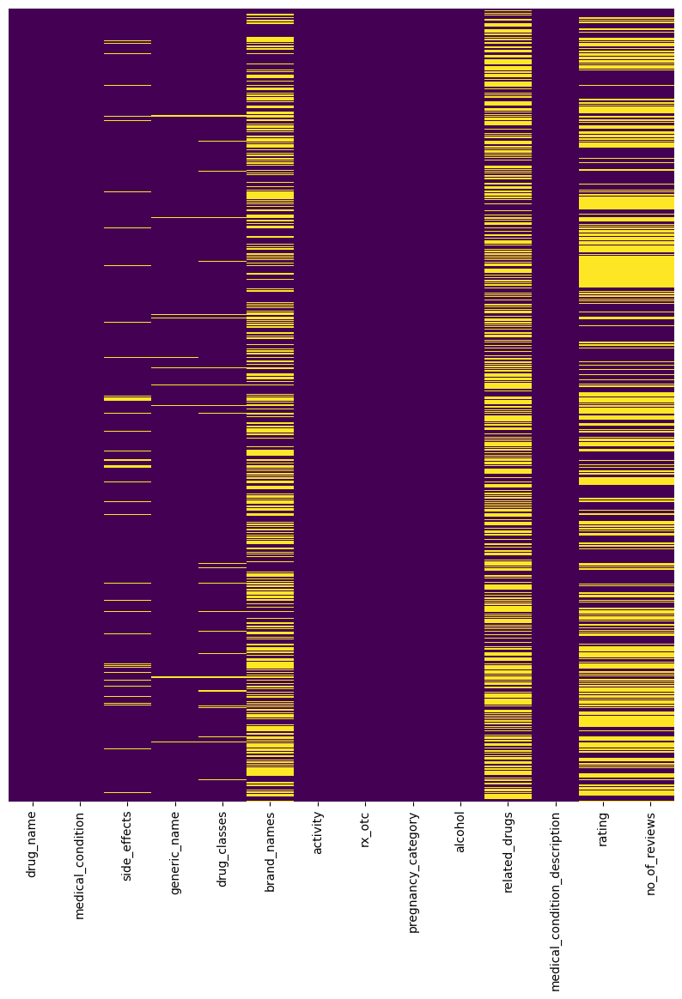

In [48]:
df3a =df3
df3a.info()
# calculate duplicates
dups = df3a.duplicated()
# report if there are any duplicates
print(df3a.any())
# list all duplicate rows

print("Duplicate Rows",df3a[dups])
#Cardinality 
df3a.nunique() # To determine the maximum and minimum number of variations in each column of the dataset
#Lets now check for null fields
import seaborn as sns
plt.figure(figsize=(10,12))
sns.heatmap(df3a.isnull(),yticklabels=False,cbar=False,cmap='viridis')
df3a.isnull().sum()

## Observations:
- It can be noticed here that the missing values are being marked as Nan and this needs to be removed

# 

# 

# 

## Descriptive Analytics

In [49]:
# Group data accordingly
unique_medical_conditions = list(df3.medical_condition.unique())
unique_drugs = list(df3.drug_name.unique())

print(f"List of unique Medical Conditions being discussed are:\n{unique_medical_conditions}\n\n")
print(f"List of unique drugs being discussed are:\n{unique_drugs}\n\n")

print(f"Number of unique drugs: {len(unique_drugs)}")
print(f"Total data rows: {df3.shape[0]}")

List of unique Medical Conditions being discussed are:
['Acne', 'ADHD', 'AIDS/HIV', 'Allergies', "Alzheimer's", 'Angina', 'Anxiety', 'Asthma', 'Bipolar Disorder', 'Bronchitis', 'Cancer', 'Cholesterol', 'Colds & Flu', 'Constipation', 'COPD', 'Covid 19', 'Depression', 'Diabetes (Type 1)', 'Diabetes (Type 2)', 'Diarrhea', 'Eczema', 'Erectile Dysfunction', 'Gastrointestinal', 'GERD (Heartburn)', 'Gout', 'Hair Loss', 'Hayfever', 'Herpes', 'Hypertension', 'Hypothyroidism', 'IBD (Bowel)', 'Incontinence', 'Insomnia', 'Menopause', 'Migraine', 'Osteoarthritis', 'Osteoporosis', 'Pain', 'Pneumonia', 'Psoriasis', 'Rheumatoid Arthritis', 'Schizophrenia', 'Seizures', 'Stroke', 'Swine Flu', 'UTI', 'Weight Loss']


List of unique drugs being discussed are:
['doxycycline', 'spironolactone', 'minocycline', 'Accutane', 'clindamycin', 'Aldactone', 'tretinoin', 'isotretinoin', 'Bactrim', 'Retin-A', 'Aczone', 'benzoyl peroxide', 'Differin', 'Epiduo', 'adapalene', 'cephalexin', 'Doryx', 'tetracycline', 'Septr

## Observation:
- Number of unique drugs and total number of data_rows are almost same, meaning that histograms for drugs won't be of any use here as there are not many repititions
- Histograms are suggested to be used when there are many data repetitions involved and there is imortance to the 'count' of a property
- But they can be used for other attributes

# 

# 

In [50]:
# Drugs being used for multiple medical conditions
drugs_multiple_condns = []
drugs_so_far = []

for i in df3.index:
    if df3["drug_name"][i] in drugs_so_far and df3["drug_name"][i] not in drugs_multiple_condns:
        drugs_multiple_condns.append(df3["drug_name"][i])
    if df3["drug_name"][i] not in drugs_so_far:
        drugs_so_far.append(df3["drug_name"][i])

print("The below is the list of only drugs that have multi-purpose:")
for i in drugs_multiple_condns:
    print(i)

The below is the list of only drugs that have multi-purpose:
minocycline
erythromycin
triamcinolone
fluocinolone
doxepin
fluticasone
mometasone
beclomethasone
ciclesonide
acyclovir
minoxidil
budesonide
hydrocortisone
cromolyn
diclofenac
diphenhydramine
clindamycin
betamethasone


# 

# Bar Graphs

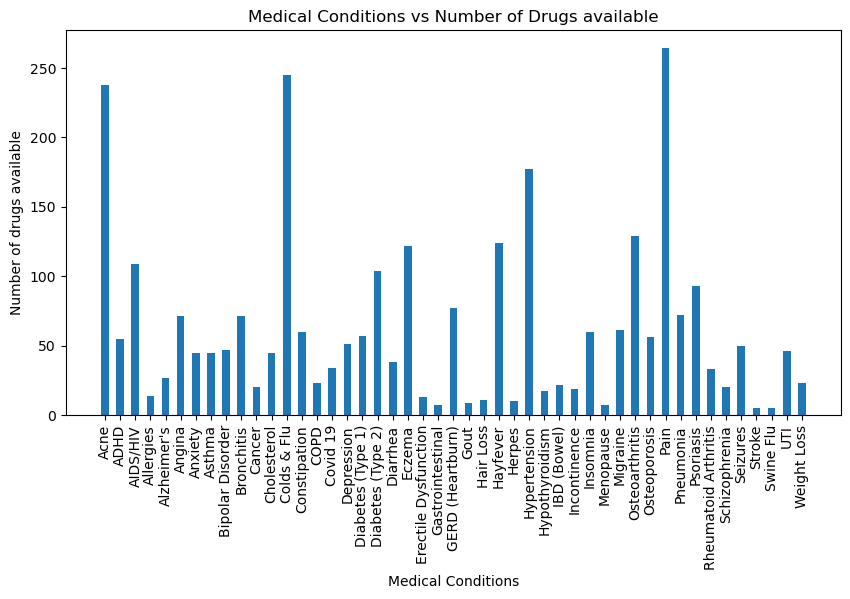

In [51]:
available_drugs_for_condns = [0]*len(unique_medical_conditions)

for i in df3.index:
    medical_condition = str(df3['medical_condition'][i])
    indexx = unique_medical_conditions.index(medical_condition)
    available_drugs_for_condns[indexx] += 1

#Bar Graph
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(unique_medical_conditions, available_drugs_for_condns, width = 0.5)
plt.xlabel("Medical Conditions")
plt.ylabel(f"Number of drugs available")
plt.title(f"Medical Conditions vs Number of Drugs available")
plt.xticks(rotation=90)
plt.show()

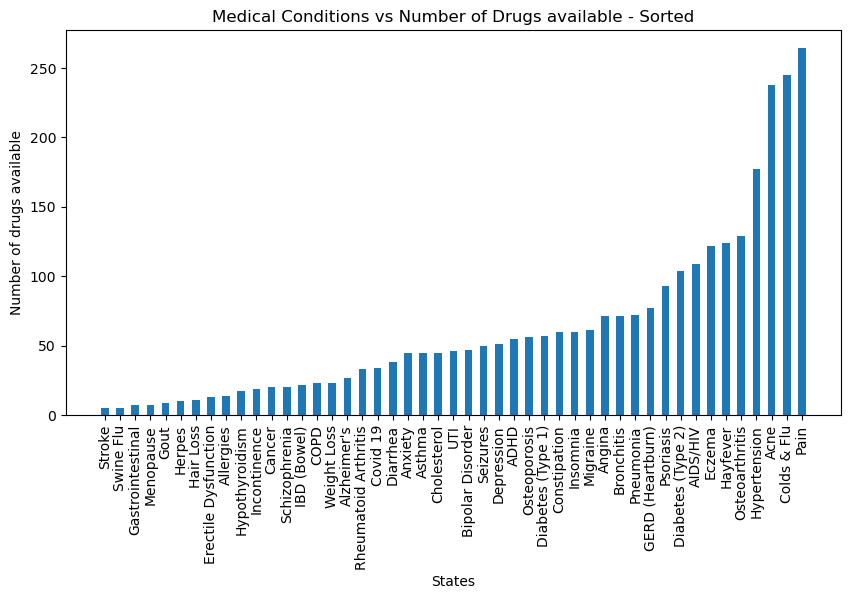

In [52]:
# Pareto Chart
available_drugs_for_condns, unique_medical_conditions = zip(*sorted(zip(available_drugs_for_condns, unique_medical_conditions)))

#Bar Graph
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(unique_medical_conditions, available_drugs_for_condns, width = 0.5)
plt.xlabel("States")
plt.ylabel(f"Number of drugs available")
plt.title(f"Medical Conditions vs Number of Drugs available - Sorted")
plt.xticks(rotation=90)
plt.show()

## Observations
1. Most drugs are available to aid for pain, colds&flu, hypertension, osteoarthritis and Hayfever
2. Least number of drugs are available for strokes, swine flu, gastrointestinal problems, menopause and gout


# 

# 

In [53]:
# Pareto Chart
activities, drugs = zip(*sorted(zip(activities, drugs)))

# Bar Graph
fig = plt.figure(figsize=(8, 4))  # Reduced figure size
plt.bar(drugs[-50:], activities[-50:], width=0.5, color="skyblue")
plt.xlabel("Drugs\nIncreasing order of demand of the drug --->")
plt.ylabel("Activity")
plt.title("Drugs vs Activity(%) - Sorted - Top 50 Most Active Drugs")
plt.xticks(rotation=90)

# Adjust y-axis to avoid starting at zero
min_activity = min(activities[-50:])
plt.ylim(min_activity - 5, max(activities[-50:]) + 5)  # Adjust range as needed

# Show the plot
plt.tight_layout()  # Ensures labels fit properly
plt.show()


NameError: name 'activities' is not defined

In [ ]:
# print(int(data["activity"][555][:-1]))
# Drugs vs Activity
activities = []
drugs = []
for i in df3.index:
    activities.append(int(df3["activity"][i][:-1]))
    drugs.append(str(df3["drug_name"][i]))


# Pareto Chart
activities, drugs = zip(*sorted(zip(activities, drugs)))

#Bar Graph
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(drugs[-50:], activities[-50:], width = 0.5)
plt.xlabel("Drugs\nIncreasing order of demand of the drug --->")
plt.ylabel(f"Activity")
plt.title(f"Drugs vs Activity(%) - Sorted - top 50 most active drugs")
plt.xticks(rotation=90)
plt.show()

## Observations:
1. Omeprazole, metformin, loperamide, etc in order of decreasing priority are the most active drugs, i.e, they are in most demand from the consumer side
2. It can be noticed that the top 10 in-demand drugs are of same importance in the consumer market

# 

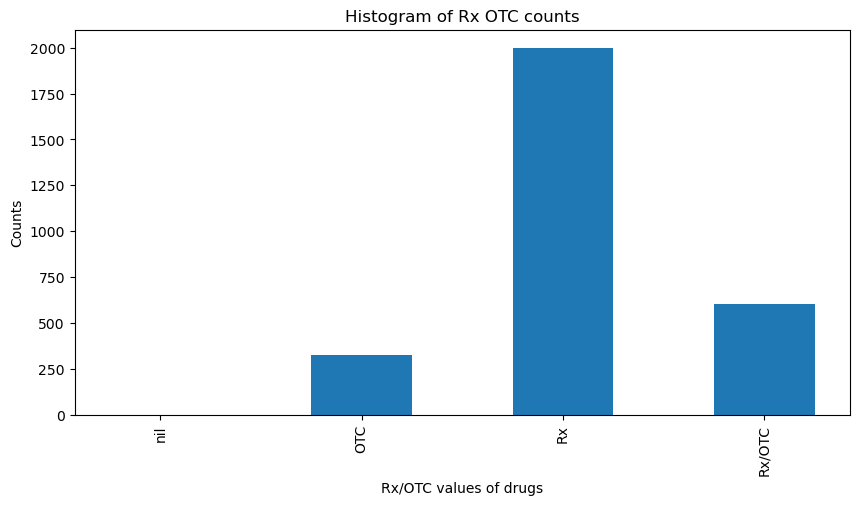

In [54]:
unique_rx_otc = ['nil', 'OTC', 'Rx', 'Rx/OTC']

cnts_rtx_otc = [0]*len(unique_rx_otc)
for i in df3.index:
    if df3["rx_otc"][i] == None:
        cnts_rtx_otc[0] += 1
    elif df3["rx_otc"][i] == 'OTC':
        cnts_rtx_otc[1] += 1
    elif df3["rx_otc"][i] == 'Rx':
        cnts_rtx_otc[2] += 1
    elif df3["rx_otc"][i] == 'Rx/OTC':
        cnts_rtx_otc[3] += 1
        
# Pareto Chart
# cnts, unique_rx_otc = zip(*sorted(zip(cnts, unique_rx_otc)))

#Bar Graph
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(unique_rx_otc, cnts_rtx_otc, width = 0.5)
plt.xlabel("Rx/OTC values of drugs")
plt.ylabel(f"Counts")
plt.title(f"Histogram of Rx OTC counts")
plt.xticks(rotation=90)
plt.show()

## Observations:
1. Most of the drugs have Rx, i.e, most of the drugs require prescription to be used. (Around 1900 from the available 2900+ drugs)
2. The remaining 1000 drugs are not that dangerous and can be prescribed or not prescribed.

# 

# 

# 

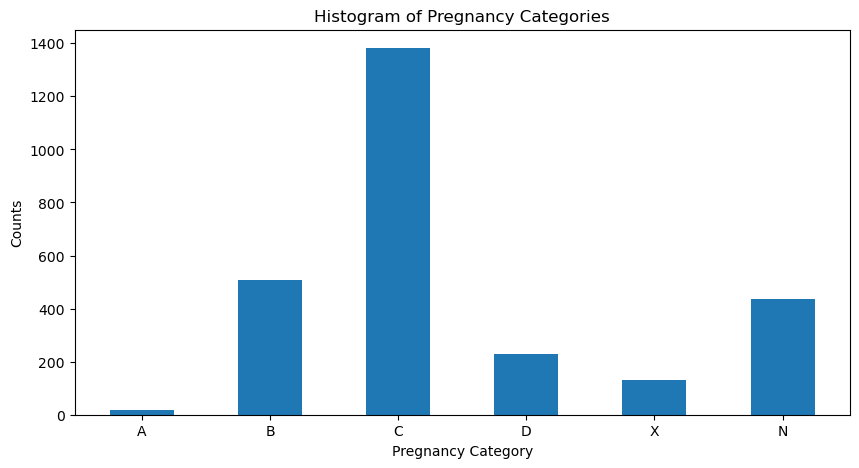

In [55]:
pregnancy_categories = ['A', 'B', 'C', 'D', 'X', 'N']

cnts_preg_cat = [0]*len(pregnancy_categories)
for i in df3.index:
    if df3["pregnancy_category"][i] == 'A':
        cnts_preg_cat[0] += 1
    elif df3["pregnancy_category"][i] == 'B':
        cnts_preg_cat[1] += 1
    elif df3["pregnancy_category"][i] == 'C':
        cnts_preg_cat[2] += 1
    elif df3["pregnancy_category"][i] == 'D':
        cnts_preg_cat[3] += 1
    elif df3["pregnancy_category"][i] == 'X':
        cnts_preg_cat[4] += 1
    elif df3["pregnancy_category"][i] == 'N':
        cnts_preg_cat[5] += 1
    
        
# Pareto Chart
#Bar Graph
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(pregnancy_categories, cnts_preg_cat, width = 0.5)
plt.xlabel("Pregnancy Category")
plt.ylabel(f"Counts")
plt.title(f"Histogram of Pregnancy Categories")
plt.xticks(rotation=0)
plt.show()

## Observation:
- Most drugs come under the pregnancy category 'C', meaning that most of the drugs show an adverse effect on the fetus and there are no adequate and well-controlled studies in humans, but potential benefits may warrant use in pregnant women despite potential risks.
- Some chunk of drugs come under categories 'B', meaning that they have no effect on the fetus
- About 500 drugs are not classified by NDA 

# 

# 

# 

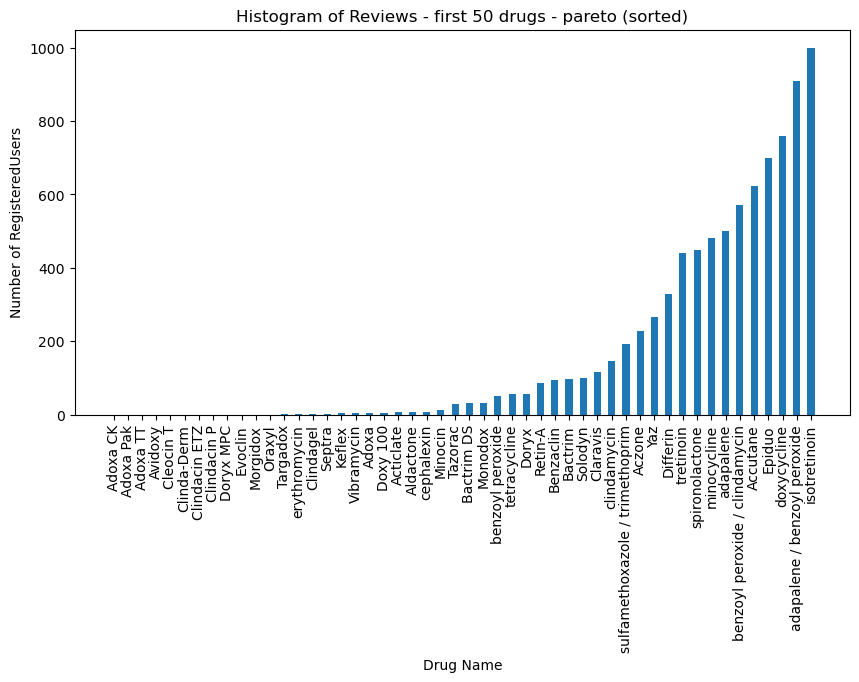

In [56]:
drug_names = []
no_of_ratings = []

num = 50

cnt = 0
for i in df3.index:
    if cnt != num:
        drug_names.append(df3["drug_name"][i])
        if not np.isnan(df3["no_of_reviews"][i]):
            no_of_ratings.append(int(df3["no_of_reviews"][i]))
        else:
            no_of_ratings.append(0)
    else:
        break
    cnt += 1

#Bar Graph
fig = plt.figure(figsize = (10, 5))
no_of_ratings, drug_names = zip(*sorted(zip(no_of_ratings, drug_names)))
# creating the bar plot
# num = 10
plt.bar(drug_names, no_of_ratings, width = 0.5)
plt.xlabel("Drug Name")
plt.ylabel(f"Number of RegisteredUsers")
plt.title(f"Histogram of Reviews - first {num} drugs - pareto (sorted)")
plt.xticks(rotation=90)
plt.show()

## Observation:
- drugs 'isotreonoin', 'adapalene', 'doxycycline', etc in sequential orders are reviewed the most by users, indicating that they are the most used drugs in the first 50 mentioned drugs

# 

# 

# 

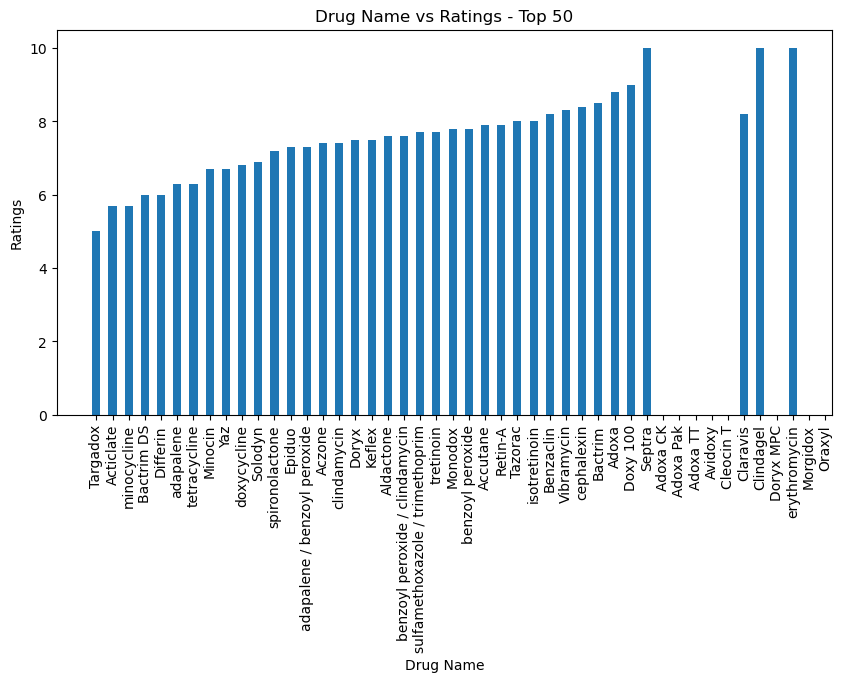

In [57]:
# Ratings
num = 50
drug_names = df3["drug_name"][:num]
ratings = df3["rating"][:num]
ratings, drug_names = zip(*sorted(zip(ratings, drug_names)))        
# Pareto Chart
#Bar Graph
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(drug_names, ratings, width = 0.5)
plt.xlabel("Drug Name")
plt.ylabel(f"Ratings")
plt.title(f"Drug Name vs Ratings - Top {num}")
plt.xticks(rotation=90)
plt.show()

C:\Users\acer\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\acer\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


<AxesSubplot:xlabel='rating', ylabel='count'>

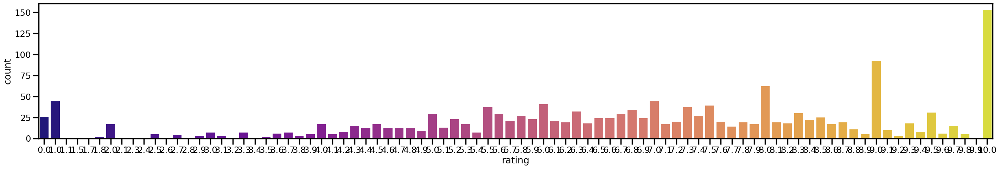

In [58]:
# Examining the variable's goal rating
sns.set_context('poster', font_scale=0.8)
plt.figure(figsize=(35,5))
sns.countplot(data=df3,x = 'rating',palette='plasma')

## Observations
- erythromycin, clindagel, septra, etc are the top rated drugs in the first 50 drugs
- **It can be noticed from this that the drugs with the most number of reviews are not in the top rated drugs, i.e, number of reviews is not an apt parameter to judge the usefulness of a drug**

Average number of times that medical conditions were noticed

# 

# 

# 

C:\Users\acer\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\acer\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


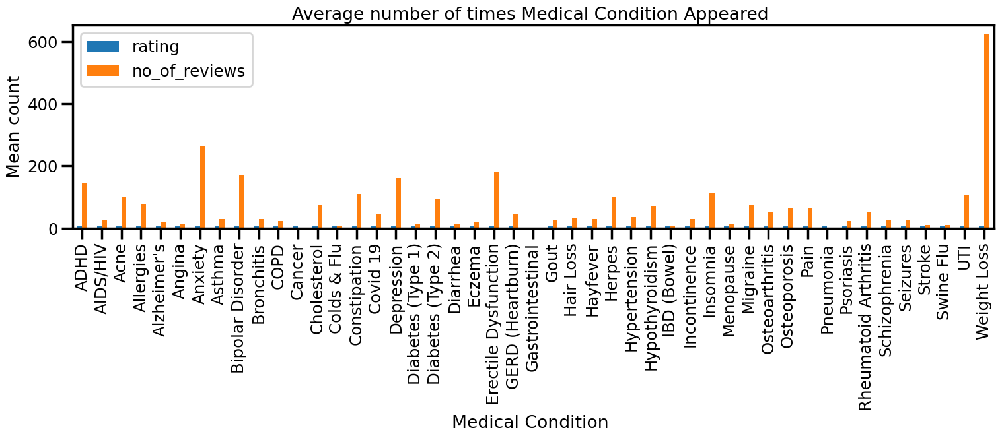

In [59]:
# data visualisation on medical_condition apears
sns.set_context('poster', font_scale=0.8)
df3.groupby('medical_condition').mean().plot(kind='bar', figsize=(18,4)) 
plt.xlabel('Medical Condition ')
plt.ylabel('Mean count')
plt.title('Average number of times Medical Condition Appeared ')
plt.show()

## Observations:
- It can be noticed that weight loss drugs have most number of reviews, showing that it is a popular concern among drug-consumers
- ADHD, Anxiety, Bipolar Disorder, Depression, Erectile Disfunction are the next most used drugs

# 

# 

### Pie Chart

1. We can use Pie Charts only for a limited combinations as it is feasible to use pie charts only when the number of attributes are lesser
2. Some possibilities are:
- Rx/OTC Distributions
- Percentage of drugs reactions with alcohol

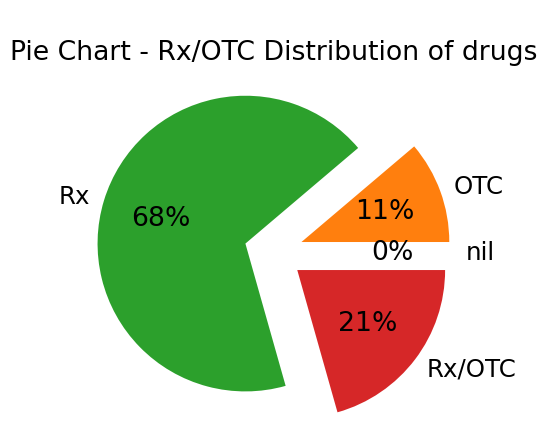

In [60]:
# Rx/OTC distributions
y = np.array(cnts_rtx_otc)
mylabels = unique_rx_otc
myexplode = [0.2]*len(unique_rx_otc)
plt.title("\nPie Chart - Rx/OTC Distribution of drugs")
plt.pie(y, labels = mylabels, explode = myexplode, autopct='%.0f%%')
plt.show() 

## Observations
- It can be observed that 68% of the drugs are of type 'Rx', meaning that they can only be used if prescribed by a doctor
- 21% of the drugs can either be prescribed or not prescribed by a doctor
- 11% of the drugs need not be prescribed by a doctor

# 

# 

# 

### Target distribution on pregnancy_category column

C:\Users\acer\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\acer\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


C    1382
B     509
N     436
0     229
D     228
X     129
A      18
Name: pregnancy_category, dtype: int64

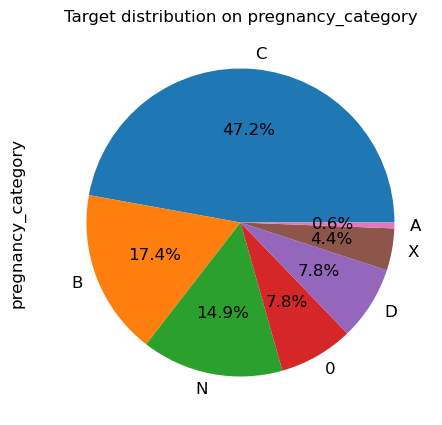

In [61]:
# Figure size 
sns.set_context('poster', font_scale=0.5)
plt.figure(figsize=(5,5))
# Pie plot
df3['pregnancy_category'].value_counts().plot.pie(autopct='%1.1f%%', textprops={'fontsize':12}).set_title("Target distribution on pregnancy_category")
df3['pregnancy_category'].value_counts()

## Observations:
- Just like the bar graph, it is clear that most drugs are of pregnancy_category type C, meaning that Animal reproduction studies have shown an adverse effect on the fetus and there are no adequate and well-controlled studies in humans, but potential benefits may warrant use in pregnant women despite potential risks.

# 

# 

# 

### Target distribution on medical condition

C:\Users\acer\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\acer\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


Pain                    264
Colds & Flu             245
Acne                    238
Hypertension            177
Osteoarthritis          129
Hayfever                124
Eczema                  122
AIDS/HIV                109
Diabetes (Type 2)       104
Psoriasis                93
GERD (Heartburn)         77
Pneumonia                72
Angina                   71
Bronchitis               71
Migraine                 61
Insomnia                 60
Constipation             60
Diabetes (Type 1)        57
Osteoporosis             56
ADHD                     55
Depression               51
Seizures                 50
Bipolar Disorder         47
UTI                      46
Asthma                   45
Anxiety                  45
Cholesterol              45
Diarrhea                 38
Covid 19                 34
Rheumatoid Arthritis     33
Alzheimer's              27
Weight Loss              23
COPD                     23
IBD (Bowel)              22
Cancer                   20
Schizophrenia       

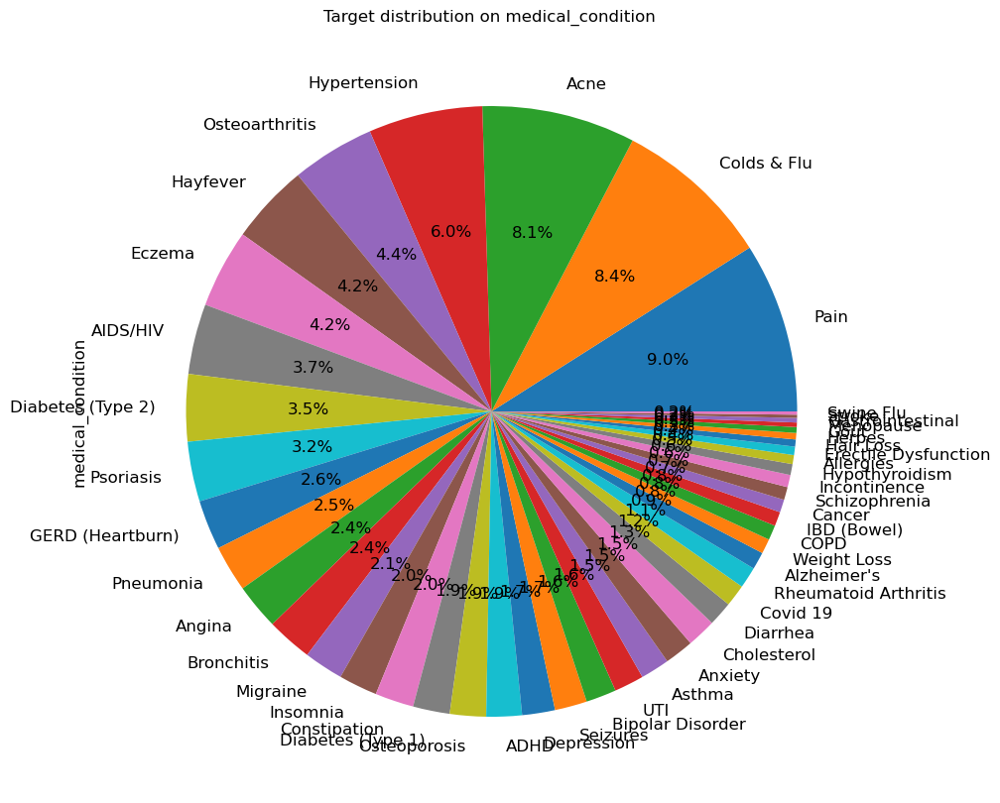

In [62]:
# Figure size 
sns.set_context('poster', font_scale=0.5)
plt.figure(figsize=(10,10))
# Pie plot
df3['medical_condition'].value_counts().plot.pie(autopct='%1.1f%%', textprops={'fontsize':12}).set_title("Target distribution on medical_condition ")
df3['medical_condition'].value_counts()

## Observations:
Top 10 diseases with most medicines available
- Pain                    264
- Colds & Flu             245
- Acne                    238
- Hypertension            177
- Osteoarthritis          129
- Hayfever                124
- Eczema                  122
- AIDS/HIV                109
- Diabetes (Type 2)       104
- Psoriasis                93

# 

# 

# 

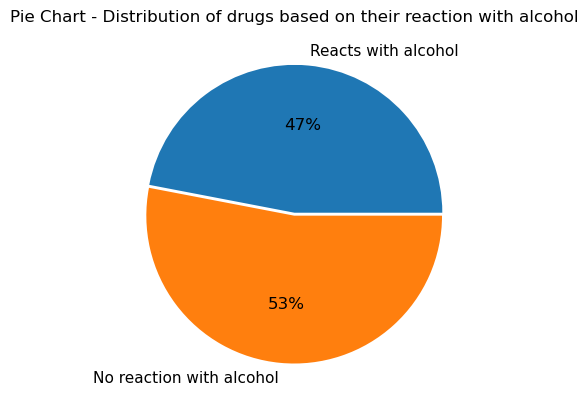

In [63]:
# Alcohol
cnts = 0

for i in df3.index:
    if df3["alcohol"][i] == 'X':
        cnts += 1
cnts_alcohol = [cnts, df3.shape[0] - cnts]
mylabels = ["Reacts with alcohol", "No reaction with alcohol"]

# Alcohol
y = np.array(cnts_alcohol)
# mylabels = unique_rx_otc
myexplode = [0.01]*2
plt.title("Pie Chart - Distribution of drugs based on their reaction with alcohol")
plt.pie(y, labels = mylabels, explode = myexplode, autopct='%.0f%%')
plt.show() 

## Observations:
- About 47% of the drugs have a reaction with alcohol, implying that alcoholic patients should have alternatives incase they have problems that can be solved only with these drugs

# 

# 

In [64]:
df3.head()

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews
0,doxycycline,Acne,"(hives, difficult breathing, swelling in your ...",doxycycline,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Adoxa CK, Adoxa Pak, Adoxa TT, Alod...",87%,Rx,D,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.8,760.0
1,spironolactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...","Aldactone, CaroSpir",82%,Rx,C,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.2,449.0
2,minocycline,Acne,"skin rash, fever, swollen glands, flu-like sym...",minocycline,Tetracyclines,"Dynacin, Minocin, Minolira, Solodyn, Ximino, V...",48%,Rx,D,0,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,482.0
3,Accutane,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...",NaN,41%,Rx,X,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.9,623.0
4,clindamycin,Acne,hives ; difficult breathing; swelling of your ...,clindamycin topical,"Topical acne agents, Vaginal anti-infectives","Cleocin T, Clindacin ETZ, Clindacin P, Clindag...",39%,Rx,B,0,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.4,146.0


# 

### Line & Scatter Plots

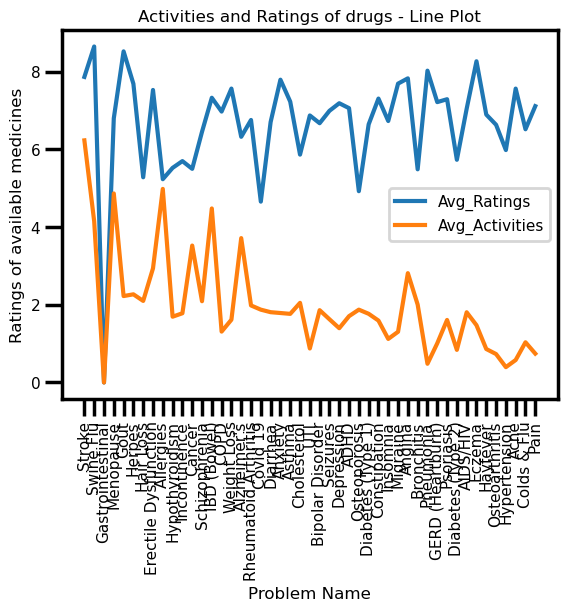

In [65]:
# Medical Conditions vs Ratings   

avg_ratings = [0]*len(unique_medical_conditions)
avg_denominator = [0]*len(unique_medical_conditions)
avg_activities = [0]*len(unique_medical_conditions)
for i in range(len(unique_medical_conditions)):
    for j in df3.index:
        if str(df3["medical_condition"][j]) == unique_medical_conditions[i] and not np.isnan(df3["rating"][j]):
            avg_ratings[i] += float(df3["rating"][j])
            avg_denominator[i] += 1
            avg_activities[i] += float(df3["activity"][j][:-1])

for i in range(len(unique_medical_conditions)):
    if avg_denominator[i] != 0:
        avg_ratings[i] = avg_ratings[i]/avg_denominator[i]
        avg_activities[i] = (avg_activities[i]/avg_denominator[i])/10

# for i in range(len(unique_medical_conditions)):
#     if avg_ratings[i]:
#         avg_ratings[i] = 0


plt.plot(unique_medical_conditions, np.array(avg_ratings))
plt.plot(unique_medical_conditions, np.array(avg_activities))
plt.xlabel(f"Problem Name")
plt.ylabel(f"Ratings of available medicines")
plt.title(f"Activities and Ratings of drugs - Line Plot")
plt.legend(["Avg_Ratings", "Avg_Activities"])
plt.xticks(rotation=90)
plt.show()

## Observations:
- It can clearly be noticed from here that except for a few anomalies, the ratings and activities of a drug are almost similar
- A drug with a good rating has more activity in sales and a drug with less rating has less activity in sales

# 

# 

# 

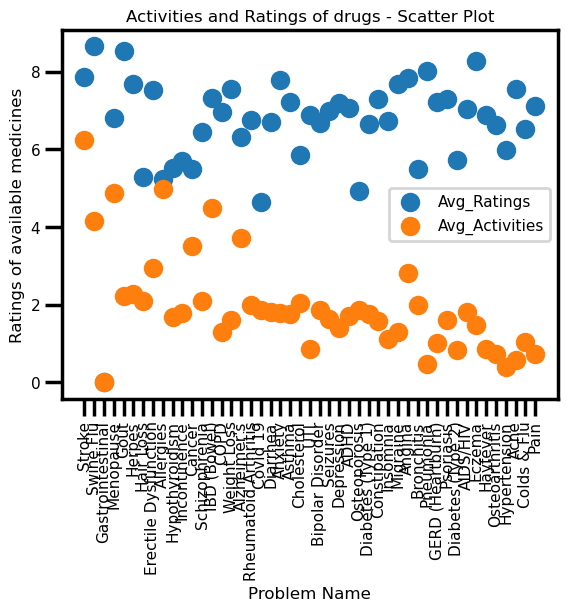

In [66]:
plt.scatter(unique_medical_conditions, np.array(avg_ratings))
plt.scatter(unique_medical_conditions, np.array(avg_activities))
plt.xlabel(f"Problem Name")
plt.ylabel(f"Ratings of available medicines")
plt.title(f"Activities and Ratings of drugs - Scatter Plot")
plt.legend(["Avg_Ratings", "Avg_Activities"])
plt.xticks(rotation=90)
plt.show()

## Observations:
- While not much can be concluded from this scatter, we can atleast say that the two parameters, ratings and activities are linearly separable

# 

# 

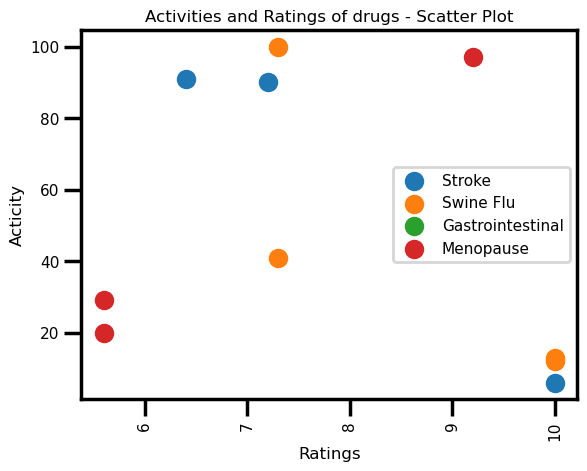

In [67]:
num = 4
diseases = unique_medical_conditions[:num]
property_chosen = [df3["rating"], df3["activity"]]

properties = []

for i in diseases:
    dataa = df3.loc[df3['medical_condition'] == i]
    rating = list(dataa["rating"])
    activity = []
    for j in dataa.index:
        activity.append(int(dataa["activity"][j][:-1]))
    plt.scatter(rating, activity)
    plt.xlabel(f"Ratings")
    plt.ylabel(f"Acticity")
    plt.title(f"Activities and Ratings of drugs - Scatter Plot")
    plt.legend(diseases)
    plt.xticks(rotation=90)


## Observations:
- It can be observed from the data that we cannot differentiate diseases based on their ratings and activity values

# 

# 

### Box-Whisker Plots

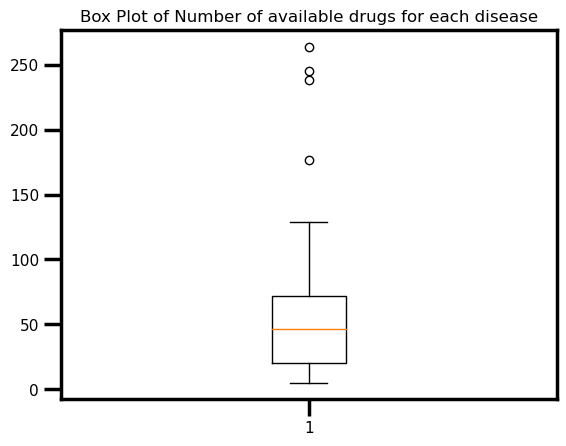

In [68]:
# available_drugs_for_condns
plt.boxplot(available_drugs_for_condns)
plt.title(f"Box Plot of Number of available drugs for each disease")
plt.show()

## Observations:
- It can be observed that this plot is not skewed as the median or 50 percentile is almost in the middle of the box.
- However, it has 4 outliers on the top meaning that there are 4 diseases who have more than abundant number of drugs available for treatment

# 

# 

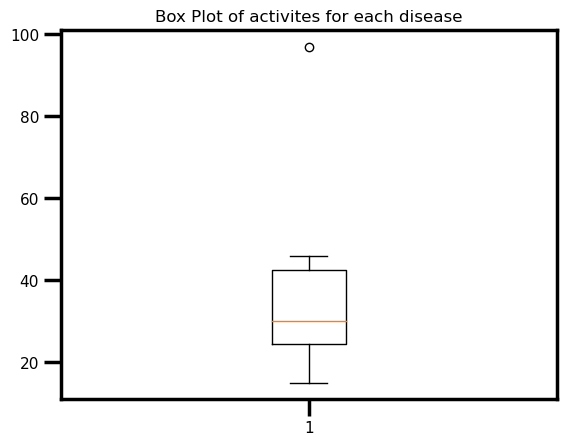

In [72]:
plt.boxplot(activity)
plt.title(f"Box Plot of activites for each disease")
plt.show()

## Observations:
- It can be observed that the given plot is right-skewed as the median/50th percentile is slightly inclined towards the bottom. 
- It can also be noticed that this plot has so many outliers, stating that 'activities' parameter is not an apt attribute to use to measure the demand of a drug

# 

# 

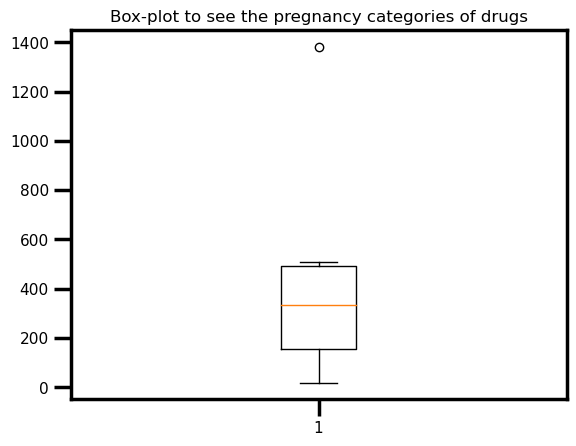

In [73]:
plt.boxplot(cnts_preg_cat)
plt.title(f"Box-plot to see the pregnancy categories of drugs")
plt.show()

## Observations:
- It can be observed that this plot of not skewed as the median or 50 percentile is almost in the middle of the box.
- However, it has no outliers on the top meaning that this can be a good attribute to be used to classify drugs

# 

# 

In [74]:
pip install plotly


Note: you may need to restart the kernel to use updated packages.


In [75]:
pip install pandas


Note: you may need to restart the kernel to use updated packages.


### Comparing rx_oct and medical_condition

In [76]:
import plotly.express as ex
ex.box(x = 'rx_otc', y = 'medical_condition',data_frame = df3, template='seaborn', notched=True, width=800, height=500)

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Observations:
- Drugs that are used for weight loss have the most need to be prescribed by Doctors only and Acne curing drugs have the least need to be prescribed by doctors


# 

# 

### Comparing drug_classes and medical_condition

In [77]:
ex.box(x = 'medical_condition', y = 'drug_classes',data_frame = df3, template='seaborn', notched=True, width=1200, height=600)

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



# 

# 

### Comparing medical_condition and pregnancy_category

In [78]:
ex.box(x = 'medical_condition', y = 'pregnancy_category',data_frame = df3, template='seaborn', notched=True, width=1200, height=600)

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Observations:
- ss

# 

# 

### Violin Plots

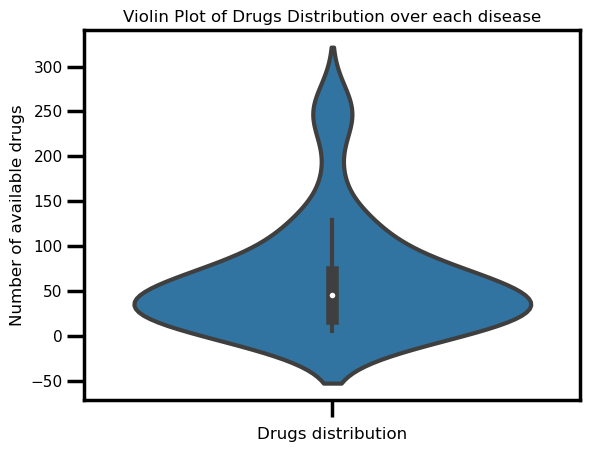

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert the tuple to a list
available_drugs_for_condns = list(available_drugs_for_condns)  # Convert tuple to list

# Violin Plot
sns.violinplot(y=available_drugs_for_condns)
plt.xlabel("Drugs distribution")
plt.ylabel("Number of available drugs")
plt.title("Violin Plot of Drugs Distribution over each disease")
plt.xticks(rotation=90)
plt.show()


## Observations:
- Violin plots are an improvement over box plots and they also show the density (here, magnitude) variation of the values.
- From the above violin plot, it can be seen that this plot is not skewed as the median or 50 percentile is almost in the middle of the box.
- But it has a significant number of outliers as the spread of the density is not uniform on the to (from after 150)

# 

# 

# 

# 

### Stem Leaf Plots

In [80]:
pip install stemgraphic


Note: you may need to restart the kernel to use updated packages.


In [81]:
import stemgraphic


(<Figure size 750x300 with 1 Axes>, <Axes:>)

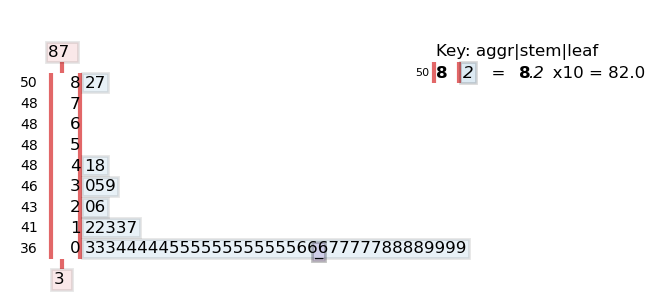

In [82]:
df3 = pd.read_csv("drugs_side_effects_drugs_com.csv")
num = 50
activity = []
for i in df3.index:
    activity.append(int(df3["activity"][i][:-1]))
# print(f"Number of Reviews of the first {num} drugs")
stemgraphic.stem_graphic(activity[:num] , scale = 10)


## Observations:
- Most of the drugs have their activities lying in the range 0-10 as that has the most values in the first 50 drugs
- 82, 87, 41, 48 percentages are all mostly outliers, but they cannot be ignored as their activity percent is higher, meaning that they have more demand in market

# 

# 

### Radar Chart

In [83]:
categories = ["activity", "rating", "no_of_reviews"]

print("Radar Chart")
fig = go.Figure()
plt.Figure(figsize =(5, 3))

fig.add_trace(go.Scatterpolar(r=df3.loc[df3["medical_condition"] == 'Acne'], theta=categories, fill='toself', name='acne'))
fig.add_trace(go.Scatterpolar(r=df3.loc[df3["medical_condition"] == 'Anxiety'], theta=categories, fill='toself', name='anxiety'))
fig.add_trace(go.Scatterpolar(r=df3.loc[df3["medical_condition"] == 'Asthma'], theta=categories, fill='toself', name='asthma'))
fig.add_trace(go.Scatterpolar(r=df3.loc[df3["medical_condition"] == 'Weight Loss'], theta=categories, fill='toself', name='weight loss'))
fig.update_layout(autosize=False, width=400, height=400)

fig.show()

Radar Chart


C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Observations:
- It can be observed that the ratios of ratings, activites, and number of reviews of acne, anxiety, asthma and weight loss are all aligned.


# 

# 

### Funnel Chart

In [84]:
# Data as a dictionary

arr = []
# for i in data.columns[3:]:
#     arr.append(math.ceil(statistics.mean(data1[i])))
#available_drugs_for_condns, unique_medical_conditions = zip(*sorted(zip(available_drugs_for_condns, unique_medical_conditions)))
df3 = dict(time=available_drugs_for_condns,
            steps=unique_medical_conditions)

fig = px.funnel(df3, x='time', y='steps')
print("Funnel Chart for Diseases and Available drugs")
fig.show()

Funnel Chart for Diseases and Available drugs


C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Observations:
1. As noted in the pareto chats, it can be seen that most drugs are available for pain, acne, osteoarithritis, etc in priority order

# 

# 

### Heat Maps

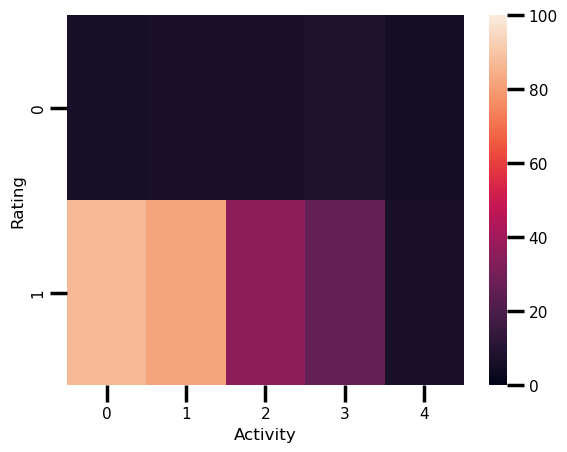

In [105]:

activity = []
rating = []
for i in df3.index:
    activity.append(int(df3["activity"][i][:-1]))
    if not np.isnan(df3["rating"][i]):
            rating.append(int(df3["rating"][i]))
    else:
            rating.append(0)
num = 5
# correlation_matrix = np.corrcoef(activity[:num], rating[:num])
heatmap_sepal = sns.heatmap([rating[:num], activity[:num]], vmin = 0, vmax = 100)
plt.xlabel("Activity")
plt.ylabel("Rating")
plt.show()

C:\Users\acer\anaconda3\lib\site-packages\seaborn\axisgrid.py:130: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\acer\anaconda3\lib\site-packages\seaborn\axisgrid.py:130: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



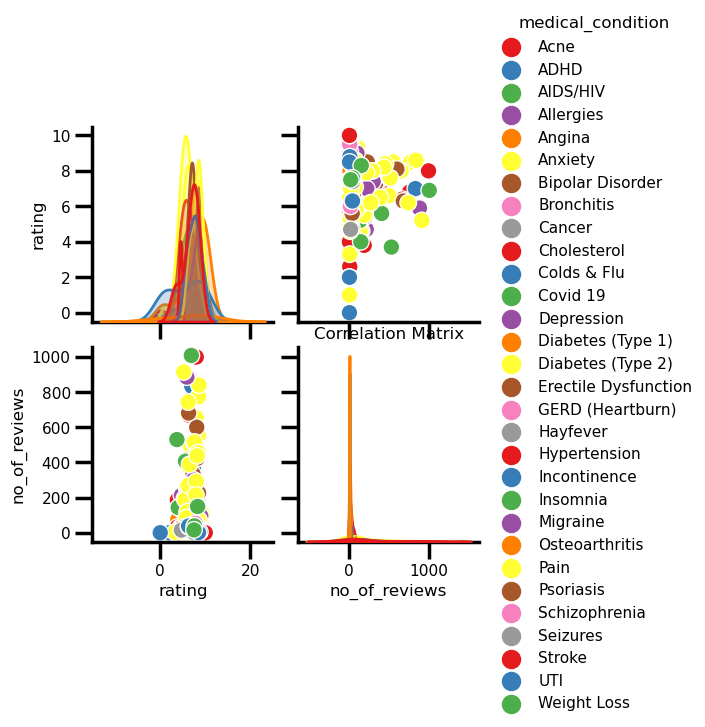

In [106]:

df = df3[["medical_condition", "rating", "no_of_reviews"]]
# df.drop(columns=df.columns[0], axis=1,  inplace=True)
sns.pairplot(df, kind="scatter", hue="medical_condition", palette="Set1")
plt.title("Correlation Matrix")
plt.show()

# 

# 

## Apriori Algorithm 

To find drugs that are most related to each other, i.e, to find Frequent Patterns

In [107]:
# Transactions
cnt = 0
for i in df3.index:
    related_drugs[cnt].append(df3["drug_name"][i])
    cnt += 1
    
print(related_drugs)

[['amoxicillin', 'prednisone', 'albuterol', 'ciprofloxacin', 'azithromycin', 'cephalexin', 'metronidazole', 'metronidazole topical', 'clindamycin topical', 'clindamycin', 'doxycycline'], ['amlodipine', 'lisinopril', 'losartan', 'metoprolol', 'furosemide', 'hydrochlorothiazide', 'carvedilol', 'warfarin', 'Lasix', 'bumetanide', 'spironolactone'], ['amoxicillin', 'prednisone', 'doxycycline', 'ciprofloxacin', 'azithromycin', 'cephalexin', 'metronidazole', 'clindamycin topical', 'Augmentin', 'dexamethasone', 'Aldactone'], ['doxycycline', 'clindamycin topical', 'erythromycin topical', 'tetracycline', 'Tazorac', 'isotretinoin'], ['doxycycline', 'metronidazole', 'metronidazole topical', 'clindamycin', 'erythromycin topical', 'tetracycline', 'isotretinoin', 'tinidazole', 'Cleocin', 'MetroGel', 'Acticlate'], ['amlodipine', 'lisinopril', 'losartan', 'metoprolol', 'furosemide', 'hydrochlorothiazide', 'carvedilol', 'spironolactone', 'Lasix', 'bumetanide', 'sulfamethoxazole / trimethoprim'], ['Adoxa

# 

# 

In [108]:
te = TransactionEncoder()
te_ary = te.fit_transform(related_drugs)

# Print the one-hot encoded Boolean array
print(te_ary)

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [109]:
df = pd.DataFrame(te_ary, columns=te.columns_)
print(df)

      Abilify  Abreva  Acidophilus  Acne Treatment  Actemra  Acticlate  \
0       False   False        False           False    False      False   
1       False   False        False           False    False      False   
2       False   False        False           False    False      False   
3       False   False        False           False    False      False   
4       False   False        False           False    False       True   
...       ...     ...          ...             ...      ...        ...   
2926    False   False        False           False    False      False   
2927    False   False        False           False    False      False   
2928    False   False        False           False    False      False   
2929    False   False        False           False    False      False   
2930    False   False        False           False    False      False   

      Adderall  Adderall XR  Adempas  Adoxa  Adriamycin  Advil PM  Adzenys ER  \
0        False        False   

In [110]:
# Use the Apriori algorithm to generate frequent itemsets
frequent_itemsets = apriori(df, min_support=0.01, use_colnames=True)

# Use the Association Rules algorithm to generate rules with a minimum confidence
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)

# Print the frequent itemsets and association rules
print("Frequent Itemsets:")
print(frequent_itemsets)

print("\nAssociation Rules:")
print(rules)

Frequent Itemsets:
       support                                           itemsets
0     0.017400                                          (Atripla)
1     0.034118                                        (Augmentin)
2     0.012282                                         (Basaglar)
3     0.011600                                         (Belsomra)
4     0.050495                                         (Benadryl)
...        ...                                                ...
2635  0.010918  (Lantus, Victoza, Tresiba, Basaglar, Levemir, ...
2636  0.012282  (hydrochlorothiazide, metoprolol, losartan, sp...
2637  0.014671  (doxycycline, ciprofloxacin, metronidazole, am...
2638  0.011600  (doxycycline, ciprofloxacin, metronidazole, am...
2639  0.014671  (doxycycline, ciprofloxacin, metronidazole, am...

[2640 rows x 2 columns]

Association Rules:
                      antecedents  \
0                       (Atripla)   
1                      (Complera)   
2                       (Atripla)

In [111]:
# Get the length of the largest frequent itemset
max_len = frequent_itemsets["itemsets"].apply(lambda x: len(x)).max()

# Print only the last level of frequent itemsets
print("Frequent Itemsets (Level {}):".format(max_len))
last_level_itemsets = frequent_itemsets[frequent_itemsets["itemsets"].apply(lambda x: len(x))==max_len]
print(last_level_itemsets)

# Use the Association Rules algorithm to generate rules with a minimum confidence
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)

# Print the association rules for the last level frequent itemsets
print("\nAssociation Rules for Frequent Itemsets (Level {}):".format(max_len))
last_level_rules = rules[rules["antecedents"].apply(lambda x: len(x)==max_len)]
print(last_level_rules)

Frequent Itemsets (Level 9):
       support                                           itemsets
2639  0.014671  (doxycycline, ciprofloxacin, metronidazole, am...

Association Rules for Frequent Itemsets (Level 9):
Empty DataFrame
Columns: [antecedents, consequents, antecedent support, consequent support, support, confidence, lift, leverage, conviction, zhangs_metric]
Index: []


## FP Growth Algorithm

To find drugs that are most related to each other, i.e, to find Frequent Patterns

In [112]:
#traversal through database for once took 4 mins
import numpy as np
# Gather All Items of Each Transactions into Numpy Array
from itertools import chain
transaction = list(chain.from_iterable(related_drugs))
# converting to numpy array
transaction = np.array(transaction)
print(transaction)

['amoxicillin' 'prednisone' 'albuterol' ... 'Wegovy' 'methamphetamine'
 'Alli']


In [113]:
#  Transform Them a Pandas DataFrame
df = pd.DataFrame(transaction, columns=["items"]) 
# Put 1 to Each Item For Making Countable Table, to be able to perform Group By
df["incident_count"] = 1 
#  Delete NaN Items from Dataset
indexNames = df[df['items'] == "nan" ].index
df.drop(indexNames , inplace=True)
# Making a New Appropriate Pandas DataFrame for Visualizations  
df_table = df.groupby("items").sum().sort_values("incident_count", ascending=False).reset_index()
#  Initial Visualizations
df_table.head(5).style.background_gradient(cmap='Blues')

,items,incident_count
0,prednisone,371
1,aspirin,287
2,acetaminophen,208
3,doxycycline,208
4,naproxen,193


#### This code creates a treemap using Plotly to visualize the top 50 items based on their incident count. It assigns a consistent label "Top 50 items" to all entries, then uses the incident_count for sizing and coloring the blocks, with hover data displaying the item names for better insights.

In [92]:
# to have a same origin
df_table["all"] = "Top 50 items" 
# creating tree map using plotly
fig = px.treemap(df_table.head(50), path=['all', "items"], values='incident_count',
                  color=df_table["incident_count"].head(50), hover_data=['items'],
                  color_continuous_scale='Blues',
                )
# ploting the treemap
fig.show()

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\acer\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [114]:
te = TransactionEncoder()
te_ary = te.fit_transform(related_drugs)

# Print the one-hot encoded Boolean array
print(te_ary)
dataset = pd.DataFrame(te_ary, columns=te.columns_)

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [115]:
# select top 30 items
first30 = df_table["items"].head(30).values 
# Extract Top 30
dataset = dataset.loc[:,first30] 
# shape of the dataset
dataset.shape

(2931, 30)

In [116]:
# select top 30 items
first30 = df_table["items"].head(30).values 
# Extract Top 30
dataset = dataset.loc[:,first30] 
# shape of the dataset
dataset.shape

(2931, 30)

In [117]:
from mlxtend.frequent_patterns.fpgrowth import fpgrowth
#running the fpgrowth algorithm
res=fpgrowth(dataset,min_support=0.05, use_colnames=True)
# printing top 10
res

,support,itemsets
0,0.126578,(prednisone)
1,0.070966,(doxycycline)
2,0.055612,(Humira)
3,0.097919,(aspirin)
4,0.064824,(tramadol)
5,0.053224,(diphenhydramine)
6,0.065848,(naproxen)
7,0.050495,(oxycodone)
8,0.050495,(Benadryl)
9,0.070966,(acetaminophen)


In [118]:
transactions = related_drugs
print(transactions[:10])

[['amoxicillin', 'prednisone', 'albuterol', 'ciprofloxacin', 'azithromycin', 'cephalexin', 'metronidazole', 'metronidazole topical', 'clindamycin topical', 'clindamycin', 'doxycycline'], ['amlodipine', 'lisinopril', 'losartan', 'metoprolol', 'furosemide', 'hydrochlorothiazide', 'carvedilol', 'warfarin', 'Lasix', 'bumetanide', 'spironolactone'], ['amoxicillin', 'prednisone', 'doxycycline', 'ciprofloxacin', 'azithromycin', 'cephalexin', 'metronidazole', 'clindamycin topical', 'Augmentin', 'dexamethasone', 'Aldactone'], ['doxycycline', 'clindamycin topical', 'erythromycin topical', 'tetracycline', 'Tazorac', 'isotretinoin'], ['doxycycline', 'metronidazole', 'metronidazole topical', 'clindamycin', 'erythromycin topical', 'tetracycline', 'isotretinoin', 'tinidazole', 'Cleocin', 'MetroGel', 'Acticlate'], ['amlodipine', 'lisinopril', 'losartan', 'metoprolol', 'furosemide', 'hydrochlorothiazide', 'carvedilol', 'spironolactone', 'Lasix', 'bumetanide', 'sulfamethoxazole / trimethoprim'], ['Adoxa

In [119]:
# Generate frequent 1-itemsets
candidate_1_itemsets = []
for transaction in transactions:
    for item in transaction:
        if [item] not in candidate_1_itemsets:
            candidate_1_itemsets.append([item])
print(len(candidate_1_itemsets))                        
print(candidate_1_itemsets)            

898
[['amoxicillin'], ['prednisone'], ['albuterol'], ['ciprofloxacin'], ['azithromycin'], ['cephalexin'], ['metronidazole'], ['metronidazole topical'], ['clindamycin topical'], ['clindamycin'], ['doxycycline'], ['amlodipine'], ['lisinopril'], ['losartan'], ['metoprolol'], ['furosemide'], ['hydrochlorothiazide'], ['carvedilol'], ['warfarin'], ['Lasix'], ['bumetanide'], ['spironolactone'], ['Augmentin'], ['dexamethasone'], ['Aldactone'], ['erythromycin topical'], ['tetracycline'], ['Tazorac'], ['isotretinoin'], ['tinidazole'], ['Cleocin'], ['MetroGel'], ['Acticlate'], ['sulfamethoxazole / trimethoprim'], ['Adoxa'], ['Claravis'], ['Myorisan'], ['drospirenone / ethinyl estradiol'], ['Gianvi'], ['ivermectin topical'], ['minocycline topical'], ['brimonidine topical'], ['oxymetazoline topical'], ['Sotret'], ['drospirenone / ethinyl estradiol / levomefolate calcium'], ['ethinyl estradiol / norethindrone'], ['Syeda'], ['Tri-Lo-Marzia'], ['Zumandimine'], ['Adderall'], ['Adderall XR'], ['methylph

In [120]:
def prune(itemsets, min_support, transactions):
    frequent_itemsets = []
    for itemset in itemsets:
        support_count = 0
        for transaction in transactions:
            if set(itemset).issubset(set(transaction)):
                support_count += 1
        if support_count >= min_support:
            frequent_itemsets.append(itemset)
    return frequent_itemsets
frequent_itemsets = prune(candidate_1_itemsets, 100 , transactions)
print(len(frequent_itemsets))
print(frequent_itemsets)

32
[['amoxicillin'], ['prednisone'], ['ciprofloxacin'], ['azithromycin'], ['clindamycin topical'], ['doxycycline'], ['amlodipine'], ['lisinopril'], ['losartan'], ['metoprolol'], ['furosemide'], ['hydrochlorothiazide'], ['Augmentin'], ['erythromycin topical'], ['Cosentyx'], ['Humira'], ['Stelara'], ['Taltz'], ['aspirin'], ['tramadol'], ['diphenhydramine'], ['cetirizine'], ['promethazine'], ['naproxen'], ['oxycodone'], ['Benadryl'], ['Buprenex'], ['acetaminophen'], ['Tylenol'], ['fluticasone nasal'], ['montelukast'], ['ibuprofen']]


In [121]:
def generate_candidates(itemsets, k):
    candidates = []
    for itemset1 in itemsets:
        for itemset2 in itemsets:
            if itemset1 != itemset2 and len(set(itemset1) | set(itemset2)) == k:
                candidate = sorted(list(set(itemset1) | set(itemset2)))
                if candidate not in candidates:
                    candidates.append(candidate)
    return candidates

'''candidate_2_itemsets = generate_candidates(frequent_itemsets,2)
frequent_itemsets = prune(candidate_2_itemsets, 300 , transactions)
print(frequent_itemsets)
print("\n")'''

def flatten(l):
    return set([item for sublist in l for item in sublist])

k=2
while len(frequent_itemsets)>0:
    candidate_itemsets=generate_candidates(frequent_itemsets,k)
    reduced_transactions = []
    for transaction in transactions:
        reduced_transaction = [item for item in transaction if item in set(flatten(frequent_itemsets))]
        if len(reduced_transaction) > 0:
            reduced_transactions.append(reduced_transaction)
    frequent_itemsets = prune(candidate_itemsets, 100 , reduced_transactions)
    print("itemsets of length ",k)
    print(len(frequent_itemsets))
    print(frequent_itemsets)  
    print("\n")
    k+=1

itemsets of length  2
54
[['amoxicillin', 'ciprofloxacin'], ['amoxicillin', 'doxycycline'], ['Augmentin', 'amoxicillin'], ['Humira', 'prednisone'], ['cetirizine', 'prednisone'], ['fluticasone nasal', 'prednisone'], ['montelukast', 'prednisone'], ['ciprofloxacin', 'doxycycline'], ['clindamycin topical', 'doxycycline'], ['clindamycin topical', 'erythromycin topical'], ['doxycycline', 'erythromycin topical'], ['amlodipine', 'lisinopril'], ['amlodipine', 'losartan'], ['amlodipine', 'metoprolol'], ['amlodipine', 'furosemide'], ['amlodipine', 'hydrochlorothiazide'], ['lisinopril', 'losartan'], ['lisinopril', 'metoprolol'], ['furosemide', 'lisinopril'], ['hydrochlorothiazide', 'lisinopril'], ['losartan', 'metoprolol'], ['furosemide', 'losartan'], ['hydrochlorothiazide', 'losartan'], ['furosemide', 'metoprolol'], ['hydrochlorothiazide', 'metoprolol'], ['furosemide', 'hydrochlorothiazide'], ['Cosentyx', 'Humira'], ['Cosentyx', 'Stelara'], ['Cosentyx', 'Taltz'], ['Humira', 'Stelara'], ['Stelara'

## Decision Tree

In [122]:
df3 = pd.read_csv("drugs_side_effects_drugs_com.csv")

df3 = df3.replace('nan', np.nan)
df3 = df3.dropna()

In [123]:
df3.alcohol.unique()

array(['X'], dtype=object)

In [124]:
df3.pregnancy_category.unique()

array(['D', 'C', 'X', 'B', 'N'], dtype=object)

In [125]:
# create a dictionary to map the values
pregnancy_map = {'X': 0, 'B': 1, 'C': 2, 'D': 3, 'N' : 0}

# map the values in the 'pregnancy' column using the dictionary
df3['pregnancy_category'] = df3['pregnancy_category'].map(pregnancy_map)
            
df3

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,csa,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews,drug_link,medical_condition_url
0,doxycycline,Acne,"(hives, difficult breathing, swelling in your ...",doxycycline,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Adoxa CK, Adoxa Pak, Adoxa TT, Alod...",87%,Rx,3,N,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.8,760.0,https://www.drugs.com/doxycycline.html,https://www.drugs.com/condition/acne.html
1,spironolactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...","Aldactone, CaroSpir",82%,Rx,2,N,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.2,449.0,https://www.drugs.com/spironolactone.html,https://www.drugs.com/condition/acne.html
5,Aldactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...",CaroSpir,35%,Rx,2,N,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.6,8.0,https://www.drugs.com/aldactone.html,https://www.drugs.com/condition/acne.html
7,isotretinoin,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Claravis, Myori...",26%,Rx,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.0,999.0,https://www.drugs.com/mtm/isotretinoin.html,https://www.drugs.com/condition/acne.html
22,Acticlate,Acne,"WARNING/CAUTION: Even though it may be rare, s...",Doxycycline Tablets and Capsules,Tetracyclines,"Adoxa, Avidoxy, Monodox, Morgidox, Oraxyl, Tar...",7%,Rx,3,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,8.0,https://www.drugs.com/cdi/acticlate.html,https://www.drugs.com/condition/acne.html
26,sulfamethoxazole / trimethoprim,Acne,"skin rash, fever, swollen glands, joint pain, ...",sulfamethoxazole and trimethoprim (oral/inject...,Sulfonamides,"Bactrim, Bactrim DS, Sulfatrim Pediatric, Sept...",7%,Rx,3,N,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.7,193.0,https://www.drugs.com/mtm/sulfamethoxazole-and...,https://www.drugs.com/condition/acne.html
30,Adoxa,Acne,"WARNING/CAUTION: Even though it may be rare, s...",Doxycycline Tablets and Capsules,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Avidoxy, Monodox, Morgidox, Oraxyl,...",5%,Rx,3,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.8,5.0,https://www.drugs.com/cdi/adoxa.html,https://www.drugs.com/condition/acne.html
42,Claravis,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Myorisan, Sotre...",4%,Rx,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.2,116.0,https://www.drugs.com/mtm/claravis.html,https://www.drugs.com/condition/acne.html
68,Myorisan,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Claravis, Myori...",2%,Rx,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.7,10.0,https://www.drugs.com/mtm/myorisan.html,https://www.drugs.com/condition/acne.html
90,drospirenone / ethinyl estradiol,Acne,hives ; difficult breathing; swelling of your ...,drospirenone and ethinyl estradiol,Contraceptives,"Gianvi, Jasmiel, Loryna, Nikki, Ocella, Syeda,...",1%,Rx,0,N,X,sertraline: https://www.drugs.com/sertraline.h...,Acne Other names: Acne Vulgaris; Blackheads; B

In [126]:
df3.rx_otc.unique()

array(['Rx', 'Rx/OTC', 'OTC'], dtype=object)

In [127]:
# create a dictionary to map the values
rx_map = {'Rx': 0, 'OTC': 1, 'Rx/OTC': 2}

# map the values in the 'pregnancy' column using the dictionary
df3['rx_otc'] = df3['rx_otc'].map(rx_map)
            
df3

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,csa,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews,drug_link,medical_condition_url
0,doxycycline,Acne,"(hives, difficult breathing, swelling in your ...",doxycycline,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Adoxa CK, Adoxa Pak, Adoxa TT, Alod...",87%,0,3,N,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.8,760.0,https://www.drugs.com/doxycycline.html,https://www.drugs.com/condition/acne.html
1,spironolactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...","Aldactone, CaroSpir",82%,0,2,N,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.2,449.0,https://www.drugs.com/spironolactone.html,https://www.drugs.com/condition/acne.html
5,Aldactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...",CaroSpir,35%,0,2,N,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.6,8.0,https://www.drugs.com/aldactone.html,https://www.drugs.com/condition/acne.html
7,isotretinoin,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Claravis, Myori...",26%,0,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.0,999.0,https://www.drugs.com/mtm/isotretinoin.html,https://www.drugs.com/condition/acne.html
22,Acticlate,Acne,"WARNING/CAUTION: Even though it may be rare, s...",Doxycycline Tablets and Capsules,Tetracyclines,"Adoxa, Avidoxy, Monodox, Morgidox, Oraxyl, Tar...",7%,0,3,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,8.0,https://www.drugs.com/cdi/acticlate.html,https://www.drugs.com/condition/acne.html
26,sulfamethoxazole / trimethoprim,Acne,"skin rash, fever, swollen glands, joint pain, ...",sulfamethoxazole and trimethoprim (oral/inject...,Sulfonamides,"Bactrim, Bactrim DS, Sulfatrim Pediatric, Sept...",7%,0,3,N,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.7,193.0,https://www.drugs.com/mtm/sulfamethoxazole-and...,https://www.drugs.com/condition/acne.html
30,Adoxa,Acne,"WARNING/CAUTION: Even though it may be rare, s...",Doxycycline Tablets and Capsules,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Avidoxy, Monodox, Morgidox, Oraxyl,...",5%,0,3,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.8,5.0,https://www.drugs.com/cdi/adoxa.html,https://www.drugs.com/condition/acne.html
42,Claravis,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Myorisan, Sotre...",4%,0,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.2,116.0,https://www.drugs.com/mtm/claravis.html,https://www.drugs.com/condition/acne.html
68,Myorisan,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Claravis, Myori...",2%,0,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.7,10.0,https://www.drugs.com/mtm/myorisan.html,https://www.drugs.com/condition/acne.html
90,drospirenone / ethinyl estradiol,Acne,hives ; difficult breathing; swelling of your ...,drospirenone and ethinyl estradiol,Contraceptives,"Gianvi, Jasmiel, Loryna, Nikki, Ocella, Syeda,...",1%,0,0,N,X,sertraline: https://www.drugs.com/sertraline.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.4,66

In [128]:
df3.activity.unique()

array(['87%', '82%', '35%', '26%', '7%', '5%', '4%', '2%', '1%', '0%',
       '95%', '51%', '32%', '16%', '14%', '12%', '3%', '9%', '75%', '19%',
       '8%', '94%', '78%', '67%', '59%', '10%', '96%', '37%', '34%',
       '17%', '6%', '53%', '30%', '100%', '33%', '68%', '42%', '28%',
       '21%', '11%', '73%', '72%', '15%', '97%', '20%', '58%', '13%',
       '36%', '29%', '52%', '46%', '40%', '22%', '23%', '38%'],
      dtype=object)

In [129]:
df3['activity'] = df3['activity'].str.strip('%')
df3.activity.unique()

array(['87', '82', '35', '26', '7', '5', '4', '2', '1', '0', '95', '51',
       '32', '16', '14', '12', '3', '9', '75', '19', '8', '94', '78',
       '67', '59', '10', '96', '37', '34', '17', '6', '53', '30', '100',
       '33', '68', '42', '28', '21', '11', '73', '72', '15', '97', '20',
       '58', '13', '36', '29', '52', '46', '40', '22', '23', '38'],
      dtype=object)

In [130]:
df3['activity'] = df3['activity'].astype(float)
df3.activity.unique()

array([ 87.,  82.,  35.,  26.,   7.,   5.,   4.,   2.,   1.,   0.,  95.,
        51.,  32.,  16.,  14.,  12.,   3.,   9.,  75.,  19.,   8.,  94.,
        78.,  67.,  59.,  10.,  96.,  37.,  34.,  17.,   6.,  53.,  30.,
       100.,  33.,  68.,  42.,  28.,  21.,  11.,  73.,  72.,  15.,  97.,
        20.,  58.,  13.,  36.,  29.,  52.,  46.,  40.,  22.,  23.,  38.])

In [131]:
df3

,drug_name,medical_condition,side_effects,generic_name,drug_classes,brand_names,activity,rx_otc,pregnancy_category,csa,alcohol,related_drugs,medical_condition_description,rating,no_of_reviews,drug_link,medical_condition_url
0,doxycycline,Acne,"(hives, difficult breathing, swelling in your ...",doxycycline,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Adoxa CK, Adoxa Pak, Adoxa TT, Alod...",87.0,0,3,N,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,6.8,760.0,https://www.drugs.com/doxycycline.html,https://www.drugs.com/condition/acne.html
1,spironolactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...","Aldactone, CaroSpir",82.0,0,2,N,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.2,449.0,https://www.drugs.com/spironolactone.html,https://www.drugs.com/condition/acne.html
5,Aldactone,Acne,hives ; difficulty breathing; swelling of your...,spironolactone,"Aldosterone receptor antagonists, Potassium-sp...",CaroSpir,35.0,0,2,N,X,amlodipine: https://www.drugs.com/amlodipine.h...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.6,8.0,https://www.drugs.com/aldactone.html,https://www.drugs.com/condition/acne.html
7,isotretinoin,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Claravis, Myori...",26.0,0,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.0,999.0,https://www.drugs.com/mtm/isotretinoin.html,https://www.drugs.com/condition/acne.html
22,Acticlate,Acne,"WARNING/CAUTION: Even though it may be rare, s...",Doxycycline Tablets and Capsules,Tetracyclines,"Adoxa, Avidoxy, Monodox, Morgidox, Oraxyl, Tar...",7.0,0,3,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,5.7,8.0,https://www.drugs.com/cdi/acticlate.html,https://www.drugs.com/condition/acne.html
26,sulfamethoxazole / trimethoprim,Acne,"skin rash, fever, swollen glands, joint pain, ...",sulfamethoxazole and trimethoprim (oral/inject...,Sulfonamides,"Bactrim, Bactrim DS, Sulfatrim Pediatric, Sept...",7.0,0,3,N,X,amoxicillin: https://www.drugs.com/amoxicillin...,Acne Other names: Acne Vulgaris; Blackheads; B...,7.7,193.0,https://www.drugs.com/mtm/sulfamethoxazole-and...,https://www.drugs.com/condition/acne.html
30,Adoxa,Acne,"WARNING/CAUTION: Even though it may be rare, s...",Doxycycline Tablets and Capsules,"Miscellaneous antimalarials, Tetracyclines","Acticlate, Avidoxy, Monodox, Morgidox, Oraxyl,...",5.0,0,3,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.8,5.0,https://www.drugs.com/cdi/adoxa.html,https://www.drugs.com/condition/acne.html
42,Claravis,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Myorisan, Sotre...",4.0,0,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.2,116.0,https://www.drugs.com/mtm/claravis.html,https://www.drugs.com/condition/acne.html
68,Myorisan,Acne,problems with your vision or hearing; muscle o...,isotretinoin (oral),"Miscellaneous antineoplastics, Miscellaneous u...","Absorica, Accutane, Amnesteem, Claravis, Myori...",2.0,0,0,N,X,doxycycline: https://www.drugs.com/doxycycline...,Acne Other names: Acne Vulgaris; Blackheads; B...,8.7,10.0,https://www.drugs.com/mtm/myorisan.html,https://www.drugs.com/condition/acne.html
90,drospirenone / ethinyl estradiol,Acne,hives ; difficult breathing; swelling of your ...,drospirenone and ethinyl estradiol,Contraceptives,"Gianvi, Jasmiel, Loryna, Nikki, Ocella, Syeda,...",1.0,0,0,N,X,sertraline: https://www.drugs.com/sertraline.h...,Acne Other names: Acne Vulgaris; Blackheads; B

In [132]:
df3.pregnancy_category.unique()

array([3, 2, 0, 1], dtype=int64)

In [133]:
df=df3
# convert each column to a numeric data type
df_numeric = df.apply(pd.to_numeric, errors='coerce')

# drop columns with non-numeric values
df_clean = df_numeric.dropna(axis=1)

# display the updated DataFrame
print(df_clean)

      activity  rx_otc  pregnancy_category  rating  no_of_reviews
0         87.0       0                   3     6.8          760.0
1         82.0       0                   2     7.2          449.0
5         35.0       0                   2     7.6            8.0
7         26.0       0                   0     8.0          999.0
22         7.0       0                   3     5.7            8.0
26         7.0       0                   3     7.7          193.0
30         5.0       0                   3     8.8            5.0
42         4.0       0                   0     8.2          116.0
68         2.0       0                   0     8.7           10.0
90         1.0       0                   0     6.4          669.0
94         1.0       0                   0     7.3           54.0
103        1.0       0                   0     8.0            3.0
163        0.0       0                   0     7.0           37.0
167        0.0       0                   0     3.8          187.0
226       

In [134]:
print(df_clean.columns)


Index(['activity', 'rx_otc', 'pregnancy_category', 'rating', 'no_of_reviews'], dtype='object')


In [135]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Ensure df_clean is properly loaded
print(df_clean.info())  # Check dataset structure

# Check if 'rx_otc' exists
if 'rx_otc' not in df_clean.columns:
    raise KeyError("'rx_otc' column is missing from the dataframe.")

# Split the data into input and output variables
X = df_clean.drop('rx_otc', axis=1)
y = df_clean['rx_otc']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create a decision tree classifier with default parameters
dtc = DecisionTreeClassifier()

# Train the model on the training data
dtc.fit(X_train, y_train)

# Evaluate the model on the testing data
score = dtc.score(X_test, y_test)
print(f"Decision Tree Accuracy: {score:.3f}")


<class 'pandas.core.frame.DataFrame'>
Int64Index: 251 entries, 0 to 2926
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   activity            251 non-null    float64
 1   rx_otc              251 non-null    int64  
 2   pregnancy_category  251 non-null    int64  
 3   rating              251 non-null    float64
 4   no_of_reviews       251 non-null    float64
dtypes: float64(3), int64(2)
memory usage: 11.8 KB
None
Decision Tree Accuracy: 0.776


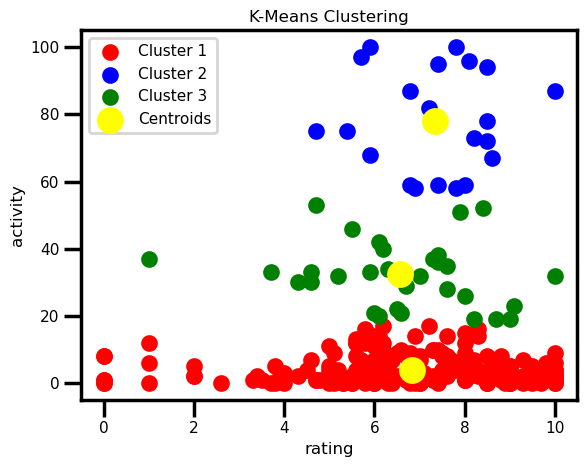

In [136]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# perform k-means clustering with k=3
df=df_clean
df=df3[['rating', 'activity']]
df = df.dropna()

X = df.values
X = df.values
kmeans = KMeans(n_clusters=3)
y_kmeans = kmeans.fit_predict(X)

# visualize the clusters with a scatter plot
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Cluster 3')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')
plt.title('K-Means Clustering')
plt.xlabel('rating')
plt.ylabel('activity')
plt.legend()
plt.show()

## Observations:
- it can be observed that 'activity' and 'rating' can be used as parameters to form clusters and differentiate between drugs

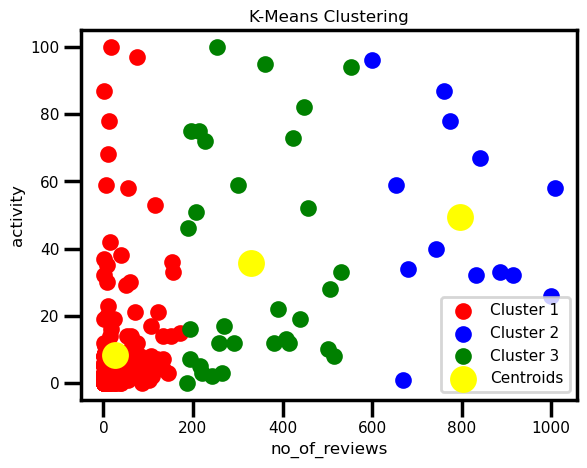

In [137]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# perform k-means clustering with k=3
df=df_clean
df=df3[['no_of_reviews', 'activity']]
df = df.dropna()

X = df.values
X = df.values
kmeans = KMeans(n_clusters=3)
y_kmeans = kmeans.fit_predict(X)

# visualize the clusters with a scatter plot
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Cluster 3')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')
plt.title('K-Means Clustering')
plt.xlabel('no_of_reviews')
plt.ylabel('activity')
plt.legend()
plt.show()

# 

# 

# 